# Pre-processing Green's Functions calculated with SPECFEM3D for source-side MTUQ moment tensor estimations

-------------------------
 
[MTUQ has the capability of reading Green's Functions](https://uafgeotools.github.io/mtuq/user_guide/03.html) calculated in Specfem3D to incorporate 3D velocity models for moment tensor estimation.
 
This example aims to guide the pre-processing of the output plain-text files (synthetic seismograms) created by Specfem3D after a simulation. Then, convert them into SAC files with the appropriate name for being read by MTUQ as a Green's Functions database for a specific earthquake.
 
**Before starting save the information about the main directory location running the following cell**:

In [27]:
import os
main_dir = os.getcwd()
print(main_dir)

/Users/felix/Documents/POSTDOC/INVESTIGACION/3_AUG_ENE_2023/Make_Specfem3D_GF/JUPYTER_NOTEBOOK


In the same directory where you found this jupyter script, you will find the following directories:

In [28]:
# Run this cell for seeing the basics directories for pre-processing the Specfem3D synthetics
%ls -d *

DATABASES_REPO/                 make_specfem3D_GF.ipynb
MTUQ_TEST/                      make_specfem3D_GF.py
README.txt                      make_specfem3D_GF.textClipping
SOLVER_REPO/                    source_side_specfem3D_mtuq.png


- **DATABASES_REPO**: contains the files for creating the mesh and the databases needed before running a synthetic seismograms simulation. 
- **SOLVER_REPO**: contains the files for running the synthetic seismograms simulations.
- **MTUQ_TEST**: contains the scripts for running a MTUQ moment tensor estimation example and testing that the pre-processed Green Functions work.
- **README.txt**: contains relevant information to read before working with this notebook.
- **make_specfem3D_GF.py**: python script for pre-processing Green's Functions. We will use it in the section 3 of this notebook. 


**Pre-requisites for using the preprocessing script**

This script works with the same python libraries installed in the mtuq anaconda environment. However, some parts of the script call Specfem3D binary files, and therefore, it is expected you have already installed  Specfem3D. Besides, the path to the binary files created during the Specfem3D installation has to be added to your bashrc profile. **If you have already calculated the synthetics for the elementary sources in Specfem3D, simply check that your files follow the directory structure shown here and go to the pre-processing part (section 3).** 

**Pre-processing overview**

The source-side workflow for MTUQ moment tensor estimation using Specfem3D Green Functions is summarized in the following figure.

In [29]:
from IPython.display import Image

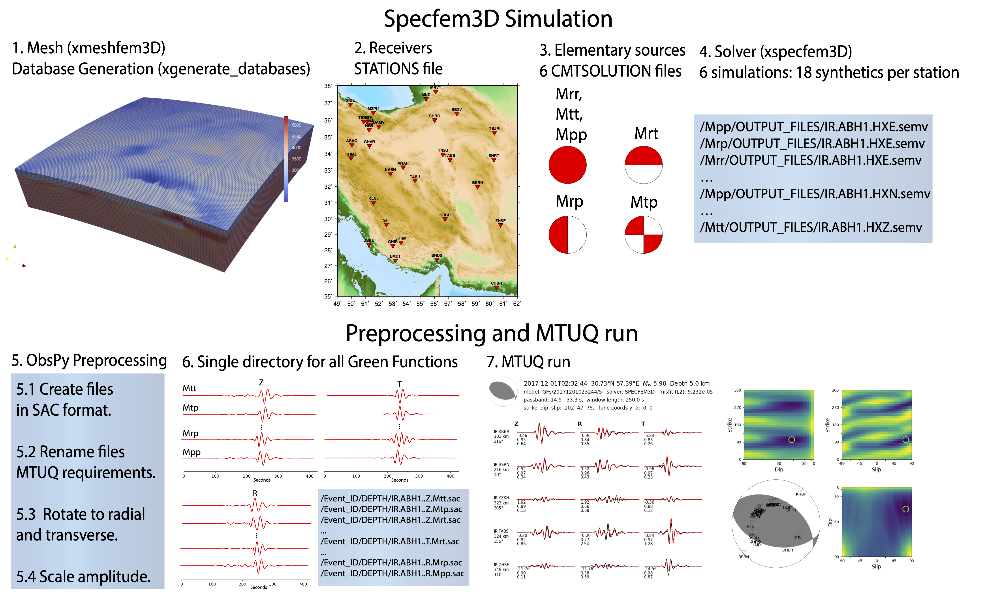

In [30]:
Image('source_side_specfem3D_mtuq.png')

The following example, has been tested for running Specfem3D cartesian for a 1D velocity model, preprocessing the synthetic seismograms after Specfem3D simulations, and run an example in MTUQ.  After testing this notebook, you can use the same file structure and modify it according to your needs.


## 1. Creating the mesh and database in Specfem3D

The first part of the workflow consists of creating the mesh and the databases used by the Specfem3D. Internally, Specfem3D generates the mesh with the binary file **xmeshfem3D** and pours the velocity model into the mesh executing **xgenerate_databases** binary file. The directory **DATABASES_REPO** contains the files for creating the mesh and the databases for the given velocity model. Go to the directory **DATABASES_REPO/1D_VM/16_PROC** running the following cell:  

In [31]:
%cd DATABASES_REPO/1D_VM/16_PROC
%ls *

/Users/felix/Documents/POSTDOC/INVESTIGACION/3_AUG_ENE_2023/Make_Specfem3D_GF/JUPYTER_NOTEBOOK/DATABASES_REPO/1D_VM/16_PROC
schedule_databases.sh*

DATA:
CMTSOLUTION      STATIONS         tomo_files/
Par_file*        meshfem3D_files/

OUTPUT_FILES:
DATABASES_MPI/         surface_from_mesher.h  values_from_mesher.h


**If you work  under Slurm workload manager, then run the following cell:**

In [32]:
! sbatch schedule_databases.sh

/bin/bash: sbatch: command not found


**Otherwise, run the following cell:**

In [33]:
#If you change the number of processes, then do it as well in the parameter files
! mpirun -np 16 xmeshfem3D
! mpirun -np 16 xgenerate_databases


--------------------------------------------------------------------------
There are not enough slots available in the system to satisfy the 16
slots that were requested by the application:

  xmeshfem3D

Either request fewer slots for your application, or make more slots
available for use.

A "slot" is the Open MPI term for an allocatable unit where we can
launch a process.  The number of slots available are defined by the
environment in which Open MPI processes are run:

  1. Hostfile, via "slots=N" clauses (N defaults to number of
     processor cores if not provided)
  2. The --host command line parameter, via a ":N" suffix on the
     hostname (N defaults to 1 if not provided)
  3. Resource manager (e.g., SLURM, PBS/Torque, LSF, etc.)
  4. If none of a hostfile, the --host command line parameter, or an
     RM is present, Open MPI defaults to the number of processor cores

In all the above cases, if you want Open MPI to default to the number
of hardware threads instead of the numb

Once you have created the mesh and generated the database, you will find the databases in **OUTPUT_FILES/DATABASES_MPI**, and you are ready to run the solver and simulate the synthetic seismograms. The dummy file before generating the databases is HI_DATABASES.txt.

In [34]:
%ls OUTPUT_FILES/DATABASES_MPI

HI_DATABSES.txt


You do not need to run xmeshfem3D and xgenerate_databases again for different simulations as long as you use the same velocity model, mesh structure, and number of processes. For instance, the provided example is intended for running in 16 processors (that is why the path is 1D_VM/16_PROC). Future simulations with only modifications in the CMTSOLUTION file (source) and the STATIONS file (receivers’ location) can use the same database.

## 2. Running the solver

In [35]:
#Let's back to the main directory
os.chdir(main_dir)

**2.1 Solver repository file structure**

Before launching the Specmfem3D solver, check the structure of the **SOLVER_REPO** directory: **SOLVER_REPO/event_id/depth_in_km**. The event id follows the format: **yyyymmddhhmmss**, where y stands for year, m for the month, d for day, and s for seconds. 

For this example you have already the structure for calculating the elementary sources for an earthquake on 2017/12/01 02:32:44 and 15 km of depth. Look at the directories running the following cell.

In [36]:
%ls SOLVER_REPO/20171201023244/15/

Mpp/       Mrp/       Mrr/       Mrt/       Mtp/       Mtt/       PROCESSED/


You will see one directory per elementary moment tensor source: Mpp,Mrp,Mrr,Mrt,Mtp,Mtt. 
Each elementary source directory contains the directory structure for running the Specfem3D solver.

In [37]:
#Let's see the content for the elementary source Mpp
%ls SOLVER_REPO/20171201023244/15/Mpp

DATA/               OUTPUT_FILES/       schedule_solver.sh*


The information regarding the source is in **DATA/CMTSOLUTION** file. Each elementary source **CMTSOLUTION** file  should contain the same information regarding the source hypocenter but differ in the moment tensor source content according to each elementary source. For instance the Mpp CMTSOLUTION file describe a source where all the moment tensor elements are zero except the Mpp one. See the **Mpp/DATA/CMTSOLUTION** file running the next cell.

In [38]:
! cat SOLVER_REPO/20171201023244/15/Mpp/DATA/CMTSOLUTION

 PDE 2017 12  1  2 32 44.0  3466557.0 1690528.0  15.0 0.0 5.9 IRAN
event name:     201712010232  
time shift:      0.0000
half duration:   1.3000
latitute:       3466557.0
longitude:      1690528.0
depth:          15.0000
Mrr:       0.000000e+23
Mtt:       0.000000e+23
Mpp:       1.000000e+23
Mrt:       0.000000e+23
Mrp:       0.000000e+23
Mtp:       0.000000e+23


Now see see the **Mrp/DATA/CMTSOLUTION** and observe the difference in the source:

In [39]:
! cat SOLVER_REPO/20171201023244/15/Mrp/DATA/CMTSOLUTION

 PDE 2017 12  1  2 32 44.0  3466557.0 1690528.0  15.0 0.0 5.9 IRAN
event name:     201712010232  
time shift:      0.0000
half duration:   1.3000
latitute:       3466557.0
longitude:      1690528.0
depth:          15.0000
Mrr:       0.000000e+23
Mtt:       0.000000e+23
Mpp:       0.000000e+23
Mrt:       0.000000e+23
Mrp:       1.000000e+23
Mtp:       0.000000e+23


**2.2 Launching the solver**

The script **make_specfem3D_GF.py** are in charge of running the Specfem3D solver, pre-processing the output files, and creating the Green Functions database to be used in MTUQ. Run the following cell for seeing the options:

In [40]:
%run -i 'make_specfem3D_GF.py' -h

usage: make_specfem3D_GF.py [-h] [-o O] [-ev EV] [-ed ED] [-dir DIR]

optional arguments:
  -h, --help  show this help message and exit
  -o O        Options: s (run solver), p (process output files). E.g., python
              make_specfem3D_GF.py -o s, will run the Specfem3D solver for the
              6 elementary sources.
  -ev EV      Event ID. E.g. -ev 20171201023244
  -ed ED      Earthquake depth in km E.g. -ed 15
  -dir DIR    Database dir E.g. -dir DATABASES_REPO/1D_VM/16_PROC/


You have to decide, between:

- Run the solver for the six elementary moment tensor sources (option s). 
- Run pre-processing for the output of six elementary moment tensor sources (option  p).  

Besides, you have to provide the following information: 


- The event ID (-ev option)  in the format: yyyymmddhhmmss. y stands for year, m for the month, d for day, and s for seconds. 
- Earthquake depth in km (-ed option). 
- Path to database directory relative to the current script position.  




For launching the solver for all the elementary sources that come with the example provided, run the following cell:

In [41]:
%run -i 'make_specfem3D_GF.py' -o s -ev 20171201023244 -ed 15 -dir DATABASES_REPO/1D_VM/16_PROC/

###Running Specfem3D solver for SOLVER_REPO/20171201023244/15/Mpp###
ln -s ../../../../../DATABASES_REPO/1D_VM/16_PROC//OUTPUT_FILES/DATABASES_MPI/ .
sbatch schedule_solver.sh
###Running Specfem3D solver for SOLVER_REPO/20171201023244/15/Mrp###
ln -s ../../../../../DATABASES_REPO/1D_VM/16_PROC//OUTPUT_FILES/DATABASES_MPI/ .
sbatch schedule_solver.sh
###Running Specfem3D solver for SOLVER_REPO/20171201023244/15/Mrr###
ln -s ../../../../../DATABASES_REPO/1D_VM/16_PROC//OUTPUT_FILES/DATABASES_MPI/ .
sbatch schedule_solver.sh
###Running Specfem3D solver for SOLVER_REPO/20171201023244/15/Mrt###
ln -s ../../../../../DATABASES_REPO/1D_VM/16_PROC//OUTPUT_FILES/DATABASES_MPI/ .
sbatch schedule_solver.sh
###Running Specfem3D solver for SOLVER_REPO/20171201023244/15/Mtp###
ln -s ../../../../../DATABASES_REPO/1D_VM/16_PROC//OUTPUT_FILES/DATABASES_MPI/ .
sbatch schedule_solver.sh
###Running Specfem3D solver for SOLVER_REPO/20171201023244/15/Mtt###
ln -s ../../../../../DATABASES_REPO/1D_VM/16_PROC//

ln: ./DATABASES_MPI: File exists
ln: ./DATABASES_MPI: File exists
ln: ./DATABASES_MPI: File exists
ln: ./DATABASES_MPI: File exists
ln: ./DATABASES_MPI: File exists
ln: ./DATABASES_MPI: File exists


The script  have created soft symlink links between the **DATABASES_MPI** in the databases repository (indicated in the -dir option) and the **OUTPUT_FILES** directories for each elementary source in the solver repository (according to the information given in -ev and -ed options). See the directories’ symbolic links by running the following cell. 



In [42]:
! ls -al SOLVER_REPO/20171201023244/15/M*/OUTPUT_FILES/DATABASES_MPI

lrwxr-xr-x  1 felix  staff  72 Feb 24 16:58 SOLVER_REPO/20171201023244/15/Mpp/OUTPUT_FILES/DATABASES_MPI -> ../../../../../DATABASES_REPO/1D_VM/16_PROC//OUTPUT_FILES/DATABASES_MPI/
lrwxr-xr-x  1 felix  staff  72 Feb 24 16:58 SOLVER_REPO/20171201023244/15/Mrp/OUTPUT_FILES/DATABASES_MPI -> ../../../../../DATABASES_REPO/1D_VM/16_PROC//OUTPUT_FILES/DATABASES_MPI/
lrwxr-xr-x  1 felix  staff  72 Feb 24 16:58 SOLVER_REPO/20171201023244/15/Mrr/OUTPUT_FILES/DATABASES_MPI -> ../../../../../DATABASES_REPO/1D_VM/16_PROC//OUTPUT_FILES/DATABASES_MPI/
lrwxr-xr-x  1 felix  staff  72 Feb 24 16:58 SOLVER_REPO/20171201023244/15/Mrt/OUTPUT_FILES/DATABASES_MPI -> ../../../../../DATABASES_REPO/1D_VM/16_PROC//OUTPUT_FILES/DATABASES_MPI/
lrwxr-xr-x  1 felix  staff  72 Feb 24 16:58 SOLVER_REPO/20171201023244/15/Mtp/OUTPUT_FILES/DATABASES_MPI -> ../../../../../DATABASES_REPO/1D_VM/16_PROC//OUTPUT_FILES/DATABASES_MPI/
lrwxr-xr-x  1 felix  staff  72 Feb 24 16:58 SOLVER_REPO/20171201023244/15/Mtt/OUTPUT_FILES/DATA

Observe that all the **OUTPUT_FILES/DATABASES_MPI** directories created for the elementary sources are soft links pointing to the same **DATABASES_MPI** directory in the database repository.

Once created the symbolic links, the algorithm runs the shell **schedule_solver.sh**  for each elementary source. This instruction is printed but its execution is commented in the script (line 71)  because running the solver for each elementary source may take several hours. Besides, consider that **schedule_solver.sh** only works if you have the slurm workload manager (sbatch) installed in your system. Otherwise, once the algorithm has created the symbolic links, you must run the solver for each elementary source by typing in the terminal: **mpirun -np 16 xspecfem3D** at each **SOLVER_REPO/20171201023244/15/[Mpp,Mrp,Mrr,Mrt,Mtp,Mtt]** directory. 

## 3. Pre-processing Specfem3D output files

**3.1 Files required for pre-processing Specfem3D output files**

Once the synthetics are ready after running the solver for each elementary source, it is time to pre-process them and make a single directory with all the synthetics in the format required by MTUQ.  For the example provided, you can see the raw synthetic seismograms for the 6 elementary sources, running the following cell:


In [43]:
! ls SOLVER_REPO/20171201023244/15/M*/OUTPUT_FILES/

SOLVER_REPO/20171201023244/15/Mpp/OUTPUT_FILES/:
DATABASES_MPI    IR.DSBU.HXZ.semv IR.KRSH.HXZ.semv IR.SHRT.HXZ.semv
IR.ABH1.HXX.semv IR.FIR.HXX.semv  IR.LAR1.HXX.semv IR.SLJL.HXX.semv
IR.ABH1.HXY.semv IR.FIR.HXY.semv  IR.LAR1.HXY.semv IR.SLJL.HXY.semv
IR.ABH1.HXZ.semv IR.FIR.HXZ.semv  IR.LAR1.HXZ.semv IR.SLJL.HXZ.semv
IR.AFRZ.HXX.semv IR.GENO.HXX.semv IR.MNB1.HXX.semv IR.SRVN.HXX.semv
IR.AFRZ.HXY.semv IR.GENO.HXY.semv IR.MNB1.HXY.semv IR.SRVN.HXY.semv
IR.AFRZ.HXZ.semv IR.GENO.HXZ.semv IR.MNB1.HXZ.semv IR.SRVN.HXZ.semv
IR.AHBO.HXX.semv IR.GHIR.HXX.semv IR.MND.HXX.semv  IR.SZD1.HXX.semv
IR.AHBO.HXY.semv IR.GHIR.HXY.semv IR.MND.HXY.semv  IR.SZD1.HXY.semv
IR.AHBO.HXZ.semv IR.GHIR.HXZ.semv IR.MND.HXZ.semv  IR.SZD1.HXZ.semv
IR.AHRM.HXX.semv IR.GHVR.HXX.semv IR.MRVT.HXX.semv IR.TABS.HXX.semv
IR.AHRM.HXY.semv IR.GHVR.HXY.semv IR.MRVT.HXY.semv IR.TABS.HXY.semv
IR.AHRM.HXZ.semv IR.GHVR.HXZ.semv IR.MRVT.HXZ.semv IR.TABS.HXZ.semv
IR.AHWZ.HXX.semv IR.GLO.HXX.semv  IR.MSHD.HXX.semv IR.TAFT.HXX.semv

For pre-processing all the synthetic seismograms, you need to provide information about the earthquake in a file named **eventinfo.txt**, and about the receivers in **STATIONS**. Both files are in SOLVER_REPO/20171201023244.


- **eventinfo.txt** follows the format YYYY-MM-DDTHH:MM:SS LATITUDE LONGITUDE DEPTH Mw.

Y stands for year, M  minute, D day, H hour, and S seconds. T is the letter that should be written between the event date and hour. 

In [44]:
! cat SOLVER_REPO/20171201023244/eventinfo.txt

2017-12-01T02:32:44.0 30.7340 57.3900 15.0 5.9

- **STATIONS** follows the same format than the Specfem3D stations file.

In [45]:
! cat SOLVER_REPO/20171201023244/STATIONS

ir1Az0 IC 30.743019980785924 57.39 0.0 0.0
ir21Az0 IC 30.923416957901292 57.39 0.0 0.0
ir41Az0 IC 31.103808897598235 57.39 0.0 0.0
ir61Az0 IC 31.284195783190516 57.39 0.0 0.0
ir81Az0 IC 31.464577598194598 57.39 0.0 0.0
ir101Az0 IC 31.64495432633035 57.39 0.0 0.0
ir121Az0 IC 31.825325951521556 57.39 0.0 0.0
ir141Az0 IC 32.0056924578966 57.39 0.0 0.0
ir161Az0 IC 32.18605382978904 57.39 0.0 0.0
ir181Az0 IC 32.36641005173815 57.39 0.0 0.0
ir201Az0 IC 32.54676110848959 57.39 0.0 0.0
ir221Az0 IC 32.72710698499588 57.39 0.0 0.0
ir241Az0 IC 32.90744766641703 57.39 0.0 0.0
ir261Az0 IC 33.087783138121054 57.39 0.0 0.0
ir281Az0 IC 33.268113385684536 57.39 0.0 0.0
ir301Az0 IC 33.44843839489316 57.39 0.0 0.0
ir321Az0 IC 33.62875815174223 57.39 0.0 0.0
ir341Az0 IC 33.80907264243717 57.39 0.0 0.0
ir361Az0 IC 33.98938185339409 57.39 0.0 0.0
ir381Az0 IC 34.16968577124025 57.39 0.0 0.0
ir401Az0 IC 34.34998438281451 57.39 0.0 0.0
ir421Az0 IC 34.53027767516791 57.39 0.0 0.0
ir441Az0 IC 34.71056563556404 5

**3.2 Launch the pre-processing**

For launching the pre-processing use the option '-o p'. Run the following cell:

In [18]:
%run -i 'make_specfem3D_GF.py' -o p -ev 20171201023244 -ed 15 -dir DATABASES_REPO/1D_VM/16_PROC/

Pre-processing Specfem3D output files
******Getting event and stations information*******
###### Converting Specfem3D files into SAC and mini-seed files #####
**********Converting to SAC files Mpp synthetics********
********** I detected velocity simulations **********
Pre-processing Mpp/OUTPUT_FILES/IR.BJRD.HXX.semv
1 Trace(s) in Stream:
BJRD.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.BJRD.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.BJRD..E.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.AHBO.HXZ.semv
1 Trace(s) in Stream:
AHBO.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.AHBO.HXZ.semv.ascii
mv Mpp/OUTPUT_FILES/IR.AHBO..Z.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.AMD1.HXZ.semv
1 Trace(s) in Stream:
AMD1.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.A

1 Trace(s) in Stream:
MZN1.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.MZN1.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.MZN1..E.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.BRJ.HXY.semv
1 Trace(s) in Stream:
BRJ.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.BRJ.HXY.semv.ascii
mv Mpp/OUTPUT_FILES/IR.BRJ..N.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.MZN1.HXY.semv
1 Trace(s) in Stream:
MZN1.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.MZN1.HXY.semv.ascii
mv Mpp/OUTPUT_FILES/IR.MZN1..N.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.NGCH.HXZ.semv
1 Trace(s) in Stream:
NGCH.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.NGCH.HXZ.semv.ascii
mv Mpp/OUTPUT_FILES/IR.NGCH..Z.Mpp.sa

1 Trace(s) in Stream:
GHVR.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.GHVR.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.GHVR..E.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.ZHSF.HXX.semv
1 Trace(s) in Stream:
ZHSF.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.ZHSF.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.ZHSF..E.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.SRVN.HXZ.semv
1 Trace(s) in Stream:
SRVN.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.SRVN.HXZ.semv.ascii
mv Mpp/OUTPUT_FILES/IR.SRVN..Z.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.JHRM.HXX.semv
1 Trace(s) in Stream:
JHRM.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.JHRM.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.JHRM..E.Mp

1 Trace(s) in Stream:
HAGD.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.HAGD.HXZ.semv.ascii
mv Mpp/OUTPUT_FILES/IR.HAGD..Z.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.VRN.HXZ.semv
1 Trace(s) in Stream:
VRN.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.VRN.HXZ.semv.ascii
mv Mpp/OUTPUT_FILES/IR.VRN..Z.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.BDRS.HXX.semv
1 Trace(s) in Stream:
BDRS.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.BDRS.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.BDRS..E.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.BSRN.HXX.semv
1 Trace(s) in Stream:
BSRN.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.BSRN.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.BSRN..E.Mpp.sa

1 Trace(s) in Stream:
CHBR.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.CHBR.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.CHBR..E.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.NHDN.HXY.semv
1 Trace(s) in Stream:
NHDN.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.NHDN.HXY.semv.ascii
mv Mpp/OUTPUT_FILES/IR.NHDN..N.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.YAZD.HXY.semv
1 Trace(s) in Stream:
YAZD.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.YAZD.HXY.semv.ascii
mv Mpp/OUTPUT_FILES/IR.YAZD..N.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.DAMV.HXY.semv
1 Trace(s) in Stream:
DAMV.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.DAMV.HXY.semv.ascii
mv Mpp/OUTPUT_FILES/IR.DAMV..N.Mp

1 Trace(s) in Stream:
SHI.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.SHI.HXZ.semv.ascii
mv Mpp/OUTPUT_FILES/IR.SHI..Z.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.TAPT.HXX.semv
1 Trace(s) in Stream:
TAPT.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.TAPT.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.TAPT..E.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.QJF1.HXZ.semv
1 Trace(s) in Stream:
QJF1.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.QJF1.HXZ.semv.ascii
mv Mpp/OUTPUT_FILES/IR.QJF1..Z.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.TSHB.HXY.semv
1 Trace(s) in Stream:
TSHB.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.TSHB.HXY.semv.ascii
mv Mpp/OUTPUT_FILES/IR.TSHB..N.Mpp.s

1 Trace(s) in Stream:
DAMV.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.DAMV.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.DAMV..E.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.KLST.HXZ.semv
1 Trace(s) in Stream:
KLST.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.KLST.HXZ.semv.ascii
mv Mpp/OUTPUT_FILES/IR.KLST..Z.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.SBZV.HXZ.semv
1 Trace(s) in Stream:
SBZV.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.SBZV.HXZ.semv.ascii
mv Mpp/OUTPUT_FILES/IR.SBZV..Z.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.CHBR.HXY.semv
1 Trace(s) in Stream:
CHBR.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.CHBR.HXY.semv.ascii
mv Mpp/OUTPUT_FILES/IR.CHBR..N.Mp

1 Trace(s) in Stream:
JASK.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.JASK.HXY.semv.ascii
mv Mpp/OUTPUT_FILES/IR.JASK..N.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.TKDS.HXY.semv
1 Trace(s) in Stream:
TKDS.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.TKDS.HXY.semv.ascii
mv Mpp/OUTPUT_FILES/IR.TKDS..N.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.KHSK.HXX.semv
1 Trace(s) in Stream:
KHSK.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.KHSK.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.KHSK..E.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.MZPU.HXX.semv
1 Trace(s) in Stream:
MZPU.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.MZPU.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.MZPU..E.Mp



Pre-processing Mpp/OUTPUT_FILES/IR.ABH1.HXY.semv
1 Trace(s) in Stream:
ABH1.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.ABH1.HXY.semv.ascii
mv Mpp/OUTPUT_FILES/IR.ABH1..N.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.CMGT.HXZ.semv
1 Trace(s) in Stream:
CMGT.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.CMGT.HXZ.semv.ascii
mv Mpp/OUTPUT_FILES/IR.CMGT..Z.Mpp.sac PROCESSED/


Pre-processing Mpp/OUTPUT_FILES/IR.NIAN.HXX.semv
1 Trace(s) in Stream:
NIAN.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mpp/OUTPUT_FILES/IR.NIAN.HXX.semv.ascii
mv Mpp/OUTPUT_FILES/IR.NIAN..E.Mpp.sac PROCESSED/


********Completing Header Information for Mpp SAC files ****
********Rotating to R and T Mpp SAC files ****
Rotating for Mpp,SRVN
Rotating for Mpp,AMD1
Rotating for Mpp,SLJL
Rotating for Mpp,LAR1
R

1 Trace(s) in Stream:
KHSK.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.KHSK.HXZ.semv.ascii
mv Mrp/OUTPUT_FILES/IR.KHSK..Z.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.KHMZ.HXX.semv
1 Trace(s) in Stream:
KHMZ.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.KHMZ.HXX.semv.ascii
mv Mrp/OUTPUT_FILES/IR.KHMZ..E.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.KHNJ.HXY.semv
1 Trace(s) in Stream:
KHNJ.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.KHNJ.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.KHNJ..N.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.JHBN.HXX.semv
1 Trace(s) in Stream:
JHBN.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.JHBN.HXX.semv.ascii
mv Mrp/OUTPUT_FILES/IR.JHBN..E.Mr

1 Trace(s) in Stream:
SHK1.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.SHK1.HXZ.semv.ascii
mv Mrp/OUTPUT_FILES/IR.SHK1..Z.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.FIR.HXY.semv
1 Trace(s) in Stream:
FIR.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.FIR.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.FIR..N.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.TEH.HXY.semv
1 Trace(s) in Stream:
TEH.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.TEH.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.TEH..N.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.MND.HXX.semv
1 Trace(s) in Stream:
MND.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.MND.HXX.semv.ascii
mv Mrp/OUTPUT_FILES/IR.MND..E.Mrp.sac PROCES

1 Trace(s) in Stream:
AHRM.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.AHRM.HXZ.semv.ascii
mv Mrp/OUTPUT_FILES/IR.AHRM..Z.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.DOBD.HXZ.semv
1 Trace(s) in Stream:
DOBD.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.DOBD.HXZ.semv.ascii
mv Mrp/OUTPUT_FILES/IR.DOBD..Z.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.KHL1.HXY.semv
1 Trace(s) in Stream:
KHL1.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.KHL1.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.KHL1..N.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.SHRT.HXX.semv
1 Trace(s) in Stream:
SHRT.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.SHRT.HXX.semv.ascii
mv Mrp/OUTPUT_FILES/IR.SHRT..E.Mr

1 Trace(s) in Stream:
AMIS.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.AMIS.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.AMIS..N.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.NASN.HXZ.semv
1 Trace(s) in Stream:
NASN.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.NASN.HXZ.semv.ascii
mv Mrp/OUTPUT_FILES/IR.NASN..Z.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.KBAM.HXZ.semv
1 Trace(s) in Stream:
KBAM.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.KBAM.HXZ.semv.ascii
mv Mrp/OUTPUT_FILES/IR.KBAM..Z.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.JHRM.HXY.semv
1 Trace(s) in Stream:
JHRM.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.JHRM.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.JHRM..N.Mr

1 Trace(s) in Stream:
DOBD.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.DOBD.HXX.semv.ascii
mv Mrp/OUTPUT_FILES/IR.DOBD..E.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.AHRM.HXX.semv
1 Trace(s) in Stream:
AHRM.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.AHRM.HXX.semv.ascii
mv Mrp/OUTPUT_FILES/IR.AHRM..E.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.CHTH.HXY.semv
1 Trace(s) in Stream:
CHTH.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.CHTH.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.CHTH..N.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.VRN.HXY.semv
1 Trace(s) in Stream:
VRN.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.VRN.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.VRN..N.Mrp.sa

1 Trace(s) in Stream:
SLJL.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.SLJL.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.SLJL..N.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.JSK1.HXY.semv
1 Trace(s) in Stream:
JSK1.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.JSK1.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.JSK1..N.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.SHRO.HXX.semv
1 Trace(s) in Stream:
SHRO.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.SHRO.HXX.semv.ascii
mv Mrp/OUTPUT_FILES/IR.SHRO..E.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.SRVN.HXY.semv
1 Trace(s) in Stream:
SRVN.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.SRVN.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.SRVN..N.Mr

1 Trace(s) in Stream:
AMD1.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.AMD1.HXX.semv.ascii
mv Mrp/OUTPUT_FILES/IR.AMD1..E.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.AHBO.HXX.semv
1 Trace(s) in Stream:
AHBO.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.AHBO.HXX.semv.ascii
mv Mrp/OUTPUT_FILES/IR.AHBO..E.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.BJRD.HXZ.semv
1 Trace(s) in Stream:
BJRD.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.BJRD.HXZ.semv.ascii
mv Mrp/OUTPUT_FILES/IR.BJRD..Z.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.MZN1.HXZ.semv
1 Trace(s) in Stream:
MZN1.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.MZN1.HXZ.semv.ascii
mv Mrp/OUTPUT_FILES/IR.MZN1..Z.Mr

1 Trace(s) in Stream:
AHBO.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.AHBO.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.AHBO..N.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.MND.HXZ.semv
1 Trace(s) in Stream:
MND.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.MND.HXZ.semv.ascii
mv Mrp/OUTPUT_FILES/IR.MND..Z.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.TPRV.HXY.semv
1 Trace(s) in Stream:
TPRV.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.TPRV.HXY.semv.ascii
mv Mrp/OUTPUT_FILES/IR.TPRV..N.Mrp.sac PROCESSED/


Pre-processing Mrp/OUTPUT_FILES/IR.SHK1.HXX.semv
1 Trace(s) in Stream:
SHK1.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrp/OUTPUT_FILES/IR.SHK1.HXX.semv.ascii
mv Mrp/OUTPUT_FILES/IR.SHK1..E.Mrp.sa

1 Trace(s) in Stream:
BJRD.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.BJRD.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.BJRD..E.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.AHBO.HXZ.semv
1 Trace(s) in Stream:
AHBO.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.AHBO.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.AHBO..Z.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.AMD1.HXZ.semv
1 Trace(s) in Stream:
AMD1.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.AMD1.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.AMD1..Z.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.BNB.HXX.semv
1 Trace(s) in Stream:
BNB.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.BNB.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.BNB..E.Mrr.sa

1 Trace(s) in Stream:
MZN1.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.MZN1.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.MZN1..E.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.BRJ.HXY.semv
1 Trace(s) in Stream:
BRJ.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.BRJ.HXY.semv.ascii
mv Mrr/OUTPUT_FILES/IR.BRJ..N.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.MZN1.HXY.semv
1 Trace(s) in Stream:
MZN1.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.MZN1.HXY.semv.ascii
mv Mrr/OUTPUT_FILES/IR.MZN1..N.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.NGCH.HXZ.semv
1 Trace(s) in Stream:
NGCH.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.NGCH.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.NGCH..Z.Mrr.sa

1 Trace(s) in Stream:
GHVR.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.GHVR.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.GHVR..E.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.ZHSF.HXX.semv
1 Trace(s) in Stream:
ZHSF.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.ZHSF.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.ZHSF..E.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.SRVN.HXZ.semv
1 Trace(s) in Stream:
SRVN.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.SRVN.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.SRVN..Z.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.JHRM.HXX.semv
1 Trace(s) in Stream:
JHRM.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.JHRM.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.JHRM..E.Mr

1 Trace(s) in Stream:
HAGD.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.HAGD.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.HAGD..Z.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.VRN.HXZ.semv
1 Trace(s) in Stream:
VRN.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.VRN.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.VRN..Z.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.BDRS.HXX.semv
1 Trace(s) in Stream:
BDRS.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.BDRS.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.BDRS..E.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.BSRN.HXX.semv
1 Trace(s) in Stream:
BSRN.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.BSRN.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.BSRN..E.Mrr.sa

1 Trace(s) in Stream:
CHBR.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.CHBR.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.CHBR..E.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.NHDN.HXY.semv
1 Trace(s) in Stream:
NHDN.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.NHDN.HXY.semv.ascii
mv Mrr/OUTPUT_FILES/IR.NHDN..N.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.YAZD.HXY.semv
1 Trace(s) in Stream:
YAZD.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.YAZD.HXY.semv.ascii
mv Mrr/OUTPUT_FILES/IR.YAZD..N.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.DAMV.HXY.semv
1 Trace(s) in Stream:
DAMV.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.DAMV.HXY.semv.ascii
mv Mrr/OUTPUT_FILES/IR.DAMV..N.Mr

1 Trace(s) in Stream:
ANAR.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.ANAR.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.ANAR..Z.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.TAPT.HXY.semv
1 Trace(s) in Stream:
TAPT.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.TAPT.HXY.semv.ascii
mv Mrr/OUTPUT_FILES/IR.TAPT..N.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.SHI.HXZ.semv
1 Trace(s) in Stream:
SHI.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.SHI.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.SHI..Z.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.TAPT.HXX.semv
1 Trace(s) in Stream:
TAPT.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.TAPT.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.TAPT..E.Mrr.sa

1 Trace(s) in Stream:
NHDN.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.NHDN.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.NHDN..E.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.YAZD.HXX.semv
1 Trace(s) in Stream:
YAZD.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.YAZD.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.YAZD..E.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.DAMV.HXX.semv
1 Trace(s) in Stream:
DAMV.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.DAMV.HXX.semv.ascii
mv Mrr/OUTPUT_FILES/IR.DAMV..E.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.KLST.HXZ.semv
1 Trace(s) in Stream:
KLST.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.KLST.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.KLST..Z.Mr

1 Trace(s) in Stream:
JHBN.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.JHBN.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.JHBN..Z.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.KHMZ.HXZ.semv
1 Trace(s) in Stream:
KHMZ.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.KHMZ.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.KHMZ..Z.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.JASK.HXY.semv
1 Trace(s) in Stream:
JASK.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.JASK.HXY.semv.ascii
mv Mrr/OUTPUT_FILES/IR.JASK..N.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.TKDS.HXY.semv
1 Trace(s) in Stream:
TKDS.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.TKDS.HXY.semv.ascii
mv Mrr/OUTPUT_FILES/IR.TKDS..N.Mr

1 Trace(s) in Stream:
GENO.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.GENO.HXY.semv.ascii
mv Mrr/OUTPUT_FILES/IR.GENO..N.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.GHIR.HXZ.semv
1 Trace(s) in Stream:
GHIR.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.GHIR.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.GHIR..Z.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.ABH1.HXY.semv
1 Trace(s) in Stream:
ABH1.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.ABH1.HXY.semv.ascii
mv Mrr/OUTPUT_FILES/IR.ABH1..N.Mrr.sac PROCESSED/


Pre-processing Mrr/OUTPUT_FILES/IR.CMGT.HXZ.semv
1 Trace(s) in Stream:
CMGT.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrr/OUTPUT_FILES/IR.CMGT.HXZ.semv.ascii
mv Mrr/OUTPUT_FILES/IR.CMGT..Z.Mr

1 Trace(s) in Stream:
ASAO.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.ASAO.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.ASAO..N.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.TPRV.HXZ.semv
1 Trace(s) in Stream:
TPRV.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.TPRV.HXZ.semv.ascii
mv Mrt/OUTPUT_FILES/IR.TPRV..Z.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.TEHA.HXX.semv
1 Trace(s) in Stream:
TEHA.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.TEHA.HXX.semv.ascii
mv Mrt/OUTPUT_FILES/IR.TEHA..E.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.YASJ.HXZ.semv
1 Trace(s) in Stream:
YASJ.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.YASJ.HXZ.semv.ascii
mv Mrt/OUTPUT_FILES/IR.YASJ..Z.Mr

1 Trace(s) in Stream:
LAR1.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.LAR1.HXX.semv.ascii
mv Mrt/OUTPUT_FILES/IR.LAR1..E.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.KHNJ.HXX.semv
1 Trace(s) in Stream:
KHNJ.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.KHNJ.HXX.semv.ascii
mv Mrt/OUTPUT_FILES/IR.KHNJ..E.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.KHMZ.HXY.semv
1 Trace(s) in Stream:
KHMZ.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.KHMZ.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.KHMZ..N.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.JASK.HXZ.semv
1 Trace(s) in Stream:
JASK.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.JASK.HXZ.semv.ascii
mv Mrt/OUTPUT_FILES/IR.JASK..Z.Mr

1 Trace(s) in Stream:
QALM.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.QALM.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.QALM..N.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.ZNGN.HXY.semv
1 Trace(s) in Stream:
ZNGN.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.ZNGN.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.ZNGN..N.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.TBJM.HXZ.semv
1 Trace(s) in Stream:
TBJM.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.TBJM.HXZ.semv.ascii
mv Mrt/OUTPUT_FILES/IR.TBJM..Z.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.KLST.HXY.semv
1 Trace(s) in Stream:
KLST.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.KLST.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.KLST..N.Mr

mv Mrt/OUTPUT_FILES/IR.TAFT..E.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.YZKH.HXY.semv
1 Trace(s) in Stream:
YZKH.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.YZKH.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.YZKH..N.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.TABS.HXZ.semv
1 Trace(s) in Stream:
TABS.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.TABS.HXZ.semv.ascii
mv Mrt/OUTPUT_FILES/IR.TABS..Z.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.JRKH.HXY.semv
1 Trace(s) in Stream:
JRKH.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.JRKH.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.JRKH..N.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.SFB.HXZ.semv
1 Trace(s) in Stream:
SFB.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 1

1 Trace(s) in Stream:
TBJM.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.TBJM.HXX.semv.ascii
mv Mrt/OUTPUT_FILES/IR.TBJM..E.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.MSHD.HXY.semv
1 Trace(s) in Stream:
MSHD.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.MSHD.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.MSHD..N.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.AMIS.HXZ.semv
1 Trace(s) in Stream:
AMIS.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.AMIS.HXZ.semv.ascii
mv Mrt/OUTPUT_FILES/IR.AMIS..Z.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.NASN.HXY.semv
1 Trace(s) in Stream:
NASN.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.NASN.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.NASN..N.Mr

1 Trace(s) in Stream:
QJF1.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.QJF1.HXZ.semv.ascii
mv Mrt/OUTPUT_FILES/IR.QJF1..Z.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.TSHB.HXY.semv
1 Trace(s) in Stream:
TSHB.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.TSHB.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.TSHB..N.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.SFB.HXX.semv
1 Trace(s) in Stream:
SFB.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.SFB.HXX.semv.ascii
mv Mrt/OUTPUT_FILES/IR.SFB..E.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.TABS.HXX.semv
1 Trace(s) in Stream:
TABS.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.TABS.HXX.semv.ascii
mv Mrt/OUTPUT_FILES/IR.TABS..E.Mrt.sa

1 Trace(s) in Stream:
SBZV.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.SBZV.HXZ.semv.ascii
mv Mrt/OUTPUT_FILES/IR.SBZV..Z.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.CHBR.HXY.semv
1 Trace(s) in Stream:
CHBR.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.CHBR.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.CHBR..N.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.NIAN.HXY.semv
1 Trace(s) in Stream:
NIAN.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.NIAN.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.NIAN..N.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.TNSJ.HXZ.semv
1 Trace(s) in Stream:
TNSJ.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.TNSJ.HXZ.semv.ascii
mv Mrt/OUTPUT_FILES/IR.TNSJ..Z.Mr

1 Trace(s) in Stream:
TKDS.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.TKDS.HXY.semv.ascii
mv Mrt/OUTPUT_FILES/IR.TKDS..N.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.KHSK.HXX.semv
1 Trace(s) in Stream:
KHSK.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.KHSK.HXX.semv.ascii
mv Mrt/OUTPUT_FILES/IR.KHSK..E.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.MZPU.HXX.semv
1 Trace(s) in Stream:
MZPU.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.MZPU.HXX.semv.ascii
mv Mrt/OUTPUT_FILES/IR.MZPU..E.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.MNB1.HXZ.semv
1 Trace(s) in Stream:
MNB1.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.MNB1.HXZ.semv.ascii
mv Mrt/OUTPUT_FILES/IR.MNB1..Z.Mr

1 Trace(s) in Stream:
CMGT.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.CMGT.HXZ.semv.ascii
mv Mrt/OUTPUT_FILES/IR.CMGT..Z.Mrt.sac PROCESSED/


Pre-processing Mrt/OUTPUT_FILES/IR.NIAN.HXX.semv
1 Trace(s) in Stream:
NIAN.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mrt/OUTPUT_FILES/IR.NIAN.HXX.semv.ascii
mv Mrt/OUTPUT_FILES/IR.NIAN..E.Mrt.sac PROCESSED/


********Completing Header Information for Mrt SAC files ****
********Rotating to R and T Mrt SAC files ****
Rotating for Mrt,JASK
Rotating for Mrt,KLST
Rotating for Mrt,NASN
Rotating for Mrt,SFB
Rotating for Mrt,SRVN
Rotating for Mrt,JSK1
Rotating for Mrt,DAMV
Rotating for Mrt,AMD1
Rotating for Mrt,YZKH
Rotating for Mrt,THKV
Rotating for Mrt,SLJL
Rotating for Mrt,LAR1
Rotating for Mrt,DSBU
Rotating for Mrt,NHDN
Rotating for Mrt,SHRO
Rotating for Mrt,BNB
Rotating for Mrt,TEH
Rotating for Mrt,ROKH
Rotating for M

1 Trace(s) in Stream:
AHBO.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.AHBO.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.AHBO..Z.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.AMD1.HXZ.semv
1 Trace(s) in Stream:
AMD1.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.AMD1.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.AMD1..Z.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.BNB.HXX.semv
1 Trace(s) in Stream:
BNB.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.BNB.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.BNB..E.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.TEH.HXX.semv
1 Trace(s) in Stream:
TEH.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.TEH.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.TEH..E.Mtp.sac PR

1 Trace(s) in Stream:
BRJ.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.BRJ.HXY.semv.ascii
mv Mtp/OUTPUT_FILES/IR.BRJ..N.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.MZN1.HXY.semv
1 Trace(s) in Stream:
MZN1.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.MZN1.HXY.semv.ascii
mv Mtp/OUTPUT_FILES/IR.MZN1..N.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.NGCH.HXZ.semv
1 Trace(s) in Stream:
NGCH.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.NGCH.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.NGCH..Z.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.AHWZ.HXZ.semv
1 Trace(s) in Stream:
AHWZ.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.AHWZ.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.AHWZ..Z.Mtp.s

1 Trace(s) in Stream:
ZHSF.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.ZHSF.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.ZHSF..E.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.SRVN.HXZ.semv
1 Trace(s) in Stream:
SRVN.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.SRVN.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.SRVN..Z.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.JHRM.HXX.semv
1 Trace(s) in Stream:
JHRM.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.JHRM.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.JHRM..E.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.AMIS.HXX.semv
1 Trace(s) in Stream:
AMIS.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.AMIS.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.AMIS..E.Mt

1 Trace(s) in Stream:
VRN.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.VRN.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.VRN..Z.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.BDRS.HXX.semv
1 Trace(s) in Stream:
BDRS.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.BDRS.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.BDRS..E.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.BSRN.HXX.semv
1 Trace(s) in Stream:
BSRN.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.BSRN.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.BSRN..E.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.TAFT.HXX.semv
1 Trace(s) in Stream:
TAFT.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.TAFT.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.TAFT..E.Mtp.s

1 Trace(s) in Stream:
NHDN.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.NHDN.HXY.semv.ascii
mv Mtp/OUTPUT_FILES/IR.NHDN..N.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.YAZD.HXY.semv
1 Trace(s) in Stream:
YAZD.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.YAZD.HXY.semv.ascii
mv Mtp/OUTPUT_FILES/IR.YAZD..N.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.DAMV.HXY.semv
1 Trace(s) in Stream:
DAMV.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.DAMV.HXY.semv.ascii
mv Mtp/OUTPUT_FILES/IR.DAMV..N.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.TBJM.HXX.semv
1 Trace(s) in Stream:
TBJM.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.TBJM.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.TBJM..E.Mt

1 Trace(s) in Stream:
TAPT.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.TAPT.HXY.semv.ascii
mv Mtp/OUTPUT_FILES/IR.TAPT..N.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.SHI.HXZ.semv
1 Trace(s) in Stream:
SHI.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.SHI.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.SHI..Z.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.TAPT.HXX.semv
1 Trace(s) in Stream:
TAPT.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.TAPT.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.TAPT..E.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.QJF1.HXZ.semv
1 Trace(s) in Stream:
QJF1.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.QJF1.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.QJF1..Z.Mtp.sa

1 Trace(s) in Stream:
YAZD.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.YAZD.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.YAZD..E.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.DAMV.HXX.semv
1 Trace(s) in Stream:
DAMV.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.DAMV.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.DAMV..E.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.KLST.HXZ.semv
1 Trace(s) in Stream:
KLST.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.KLST.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.KLST..Z.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.SBZV.HXZ.semv
1 Trace(s) in Stream:
SBZV.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.SBZV.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.SBZV..Z.Mt

1 Trace(s) in Stream:
KHMZ.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.KHMZ.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.KHMZ..Z.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.JASK.HXY.semv
1 Trace(s) in Stream:
JASK.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.JASK.HXY.semv.ascii
mv Mtp/OUTPUT_FILES/IR.JASK..N.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.TKDS.HXY.semv
1 Trace(s) in Stream:
TKDS.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.TKDS.HXY.semv.ascii
mv Mtp/OUTPUT_FILES/IR.TKDS..N.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.KHSK.HXX.semv
1 Trace(s) in Stream:
KHSK.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.KHSK.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.KHSK..E.Mt

1 Trace(s) in Stream:
GHIR.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.GHIR.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.GHIR..Z.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.ABH1.HXY.semv
1 Trace(s) in Stream:
ABH1.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.ABH1.HXY.semv.ascii
mv Mtp/OUTPUT_FILES/IR.ABH1..N.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.CMGT.HXZ.semv
1 Trace(s) in Stream:
CMGT.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.CMGT.HXZ.semv.ascii
mv Mtp/OUTPUT_FILES/IR.CMGT..Z.Mtp.sac PROCESSED/


Pre-processing Mtp/OUTPUT_FILES/IR.NIAN.HXX.semv
1 Trace(s) in Stream:
NIAN.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtp/OUTPUT_FILES/IR.NIAN.HXX.semv.ascii
mv Mtp/OUTPUT_FILES/IR.NIAN..E.Mt

Rotating for Mtp,NGCH
Rotating for Mtp,SHGR
Rotating for Mtp,TSHB
Rotating for Mtp,ASAO
Rotating for Mtp,KHNJ
Rotating for Mtp,CHTH
Rotating for Mtp,KLNJ
Rotating for Mtp,FIR
Rotating for Mtp,AHWZ
Rotating for Mtp,MRVT
Rotating for Mtp,TEHA
Rotating for Mtp,NIAN
Rotating for Mtp,ROKH
Rotating for Mtp,TEH
Rotating for Mtp,VRN
Rotating for Mtp,KHL1
Rotating for Mtp,LAR1
Rotating for Mtp,DSBU
Rotating for Mtp,QJF1
Rotating for Mtp,ANAR
Rotating for Mtp,SLJL
Rotating for Mtp,AMD1
Rotating for Mtp,SRVN
Rotating for Mtp,GTMR
Rotating for Mtp,NASN
Rotating for Mtp,KLST
Rotating for Mtp,SFB
Rotating for Mtp,SRVN
Rotating for Mtp,GTMR
Rotating for Mtp,DAMV
Rotating for Mtp,GENO
Rotating for Mtp,SLJL
Rotating for Mtp,THKV
Rotating for Mtp,ANAR
Rotating for Mtp,AMD1
Rotating for Mtp,GHIR
Rotating for Mtp,JHRM
Rotating for Mtp,MZN1
Rotating for Mtp,KHMZ
Rotating for Mtp,QALM
Rotating for Mtp,NHDN
Rotating for Mtp,DSBU
Rotating for Mtp,LAR1
Rotating for Mtp,MNB1
Rotating for Mtp,SHRO
Rotating for M

1 Trace(s) in Stream:
KHNJ.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.KHNJ.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.KHNJ..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.JHBN.HXX.semv
1 Trace(s) in Stream:
JHBN.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.JHBN.HXX.semv.ascii
mv Mtt/OUTPUT_FILES/IR.JHBN..E.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.LAR1.HXY.semv
1 Trace(s) in Stream:
LAR1.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.LAR1.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.LAR1..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.RMKL.HXZ.semv
1 Trace(s) in Stream:
RMKL.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.RMKL.HXZ.semv.ascii
mv Mtt/OUTPUT_FILES/IR.RMKL..Z.Mt

1 Trace(s) in Stream:
TEH.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.TEH.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.TEH..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.MND.HXX.semv
1 Trace(s) in Stream:
MND.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.MND.HXX.semv.ascii
mv Mtt/OUTPUT_FILES/IR.MND..E.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.BNB.HXY.semv
1 Trace(s) in Stream:
BNB.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.BNB.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.BNB..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.BJRD.HXY.semv
1 Trace(s) in Stream:
BJRD.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.BJRD.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.BJRD..N.Mtt.sac PROCE

1 Trace(s) in Stream:
ZHDN.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.ZHDN.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.ZHDN..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.ZHDN.HXX.semv
1 Trace(s) in Stream:
ZHDN.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.ZHDN.HXX.semv.ascii
mv Mtt/OUTPUT_FILES/IR.ZHDN..E.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.SHRT.HXY.semv
1 Trace(s) in Stream:
SHRT.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.SHRT.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.SHRT..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.KHL1.HXX.semv
1 Trace(s) in Stream:
KHL1.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.KHL1.HXX.semv.ascii
mv Mtt/OUTPUT_FILES/IR.KHL1..E.Mt



Pre-processing Mtt/OUTPUT_FILES/IR.ZHSF.HXY.semv
1 Trace(s) in Stream:
ZHSF.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.ZHSF.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.ZHSF..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.SHRO.HXZ.semv
1 Trace(s) in Stream:
SHRO.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.SHRO.HXZ.semv.ascii
mv Mtt/OUTPUT_FILES/IR.SHRO..Z.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.GHVR.HXY.semv
1 Trace(s) in Stream:
GHVR.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.GHVR.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.GHVR..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.THKV.HXY.semv
1 Trace(s) in Stream:
THKV.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.TH

1 Trace(s) in Stream:
JRKH.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.JRKH.HXZ.semv.ascii
mv Mtt/OUTPUT_FILES/IR.JRKH..Z.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.SFB.HXY.semv
1 Trace(s) in Stream:
SFB.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.SFB.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.SFB..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.TSHB.HXX.semv
1 Trace(s) in Stream:
TSHB.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.TSHB.HXX.semv.ascii
mv Mtt/OUTPUT_FILES/IR.TSHB..E.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.ANAR.HXZ.semv
1 Trace(s) in Stream:
ANAR.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.ANAR.HXZ.semv.ascii
mv Mtt/OUTPUT_FILES/IR.ANAR..Z.Mtt.sa

1 Trace(s) in Stream:
MSHD.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.MSHD.HXX.semv.ascii
mv Mtt/OUTPUT_FILES/IR.MSHD..E.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.QALM.HXZ.semv
1 Trace(s) in Stream:
QALM.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.QALM.HXZ.semv.ascii
mv Mtt/OUTPUT_FILES/IR.QALM..Z.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.TBJM.HXY.semv
1 Trace(s) in Stream:
TBJM.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.TBJM.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.TBJM..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.ZNGN.HXZ.semv
1 Trace(s) in Stream:
ZNGN.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.ZNGN.HXZ.semv.ascii
mv Mtt/OUTPUT_FILES/IR.ZNGN..Z.Mt

1 Trace(s) in Stream:
SZD1.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.SZD1.HXX.semv.ascii
mv Mtt/OUTPUT_FILES/IR.SZD1..E.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.MRVT.HXX.semv
1 Trace(s) in Stream:
MRVT.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.MRVT.HXX.semv.ascii
mv Mtt/OUTPUT_FILES/IR.MRVT..E.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.AHWZ.HXY.semv
1 Trace(s) in Stream:
AHWZ.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.AHWZ.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.AHWZ..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.RMKL.HXX.semv
1 Trace(s) in Stream:
RMKL.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.RMKL.HXX.semv.ascii
mv Mtt/OUTPUT_FILES/IR.RMKL..E.Mt

1 Trace(s) in Stream:
BNDS.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.BNDS.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.BNDS..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.GLO.HXY.semv
1 Trace(s) in Stream:
GLO.HXY.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.GLO.HXY.semv.ascii
mv Mtt/OUTPUT_FILES/IR.GLO..N.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.KRSH.HXX.semv
1 Trace(s) in Stream:
KRSH.HXX.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.KRSH.HXX.semv.ascii
mv Mtt/OUTPUT_FILES/IR.KRSH..E.Mtt.sac PROCESSED/


Pre-processing Mtt/OUTPUT_FILES/IR.SHGR.HXZ.semv
1 Trace(s) in Stream:
SHGR.HXZ.00.IR | 2017-12-01T02:32:44.000000Z - 2017-12-01T02:39:43.990000Z | 100.0 Hz, 42000 samples
rm Mtt/OUTPUT_FILES/IR.SHGR.HXZ.semv.ascii
mv Mtt/OUTPUT_FILES/IR.SHGR..Z.Mtt.sa

Rotating for Mtt,HAGD
Rotating for Mtt,DOBD
Rotating for Mtt,GTMR
Rotating for Mtt,YAZD
Rotating for Mtt,GENO
Rotating for Mtt,TKDS
Rotating for Mtt,ANAR
Rotating for Mtt,GHIR
Rotating for Mtt,TPRV
Rotating for Mtt,JHRM
Rotating for Mtt,MZN1
Rotating for Mtt,QALM
Rotating for Mtt,KHMZ
Rotating for Mtt,MNB1
Rotating for Mtt,TNSJ
Rotating for Mtt,VRN
Rotating for Mtt,TBJM
Rotating for Mtt,SBZV
Rotating for Mtt,ZNGN
Rotating for Mtt,MSHD
Rotating for Mtt,TEHA
Rotating for Mtt,MRVT
Rotating for Mtt,FIR
Rotating for Mtt,CHTH
Rotating for Mtt,GHVR
Rotating for Mtt,RMKL
Rotating for Mtt,TABS
Rotating for Mtt,BRJ
Rotating for Mtt,TSHB
Rotating for Mtt,SHGR
Rotating for Mtt,AFRZ
Rotating for Mtt,ZHDN
Rotating for Mtt,BMDN
Rotating for Mtt,SHGR
Rotating for Mtt,MZPU
Rotating for Mtt,TABS
Rotating for Mtt,ASAO
Rotating for Mtt,GNBJ
Rotating for Mtt,GHVR
Rotating for Mtt,KLNJ
Rotating for Mtt,TEHA
Rotating for Mtt,AHWZ
Rotating for Mtt,ROKH
Rotating for Mtt,KHL1
Rotating for Mtt,CHBR
Rotating for 

Integrating PROCESSED/IR.AFRZ..T.Mpp.sac
Integrating PROCESSED/IR.DOBD..R.Mtt.sac
Integrating PROCESSED/IR.JASK..R.Mrr.sac
Integrating PROCESSED/IR.SHRT..E.Mtt.sac
Integrating PROCESSED/IR.BMDN..E.Mrr.sac
Integrating PROCESSED/IR.JHBN..Z.Mtp.sac
Integrating PROCESSED/IR.AHRM..E.Mrt.sac
Integrating PROCESSED/IR.GLO..R.Mrp.sac
Integrating PROCESSED/IR.TSHB..T.Mtp.sac
Integrating PROCESSED/IR.HAGD..N.Mtp.sac
Integrating PROCESSED/IR.SHRT..N.Mrr.sac
Integrating PROCESSED/IR.ZHDN..T.Mtt.sac
Integrating PROCESSED/IR.AFRZ..E.Mrp.sac
Integrating PROCESSED/IR.BMDN..N.Mtt.sac
Integrating PROCESSED/IR.SFB..R.Mrt.sac
Integrating PROCESSED/IR.SZD1..Z.Mtt.sac
Integrating PROCESSED/IR.KLST..N.Mrt.sac
Integrating PROCESSED/IR.SHK1..E.Mrr.sac
Integrating PROCESSED/IR.LAR1..Z.Mpp.sac
Integrating PROCESSED/IR.DSBU..Z.Mpp.sac
Integrating PROCESSED/IR.NHDN..Z.Mrr.sac
Integrating PROCESSED/IR.JASK..N.Mrp.sac
Integrating PROCESSED/IR.CMGT..E.Mrr.sac
Integrating PROCESSED/IR.AFRZ..R.Mtt.sac
Integrating PROCES

Integrating PROCESSED/IR.AMIS..N.Mrt.sac
Integrating PROCESSED/IR.TEH..E.Mtp.sac
Integrating PROCESSED/IR.ANAR..Z.Mpp.sac
Integrating PROCESSED/IR.THKV..Z.Mrp.sac
Integrating PROCESSED/IR.ROKH..T.Mtp.sac
Integrating PROCESSED/IR.BNDS..Z.Mtt.sac
Integrating PROCESSED/IR.VRN..E.Mpp.sac
Integrating PROCESSED/IR.CHBR..E.Mrp.sac
Integrating PROCESSED/IR.TBJM..N.Mpp.sac
Integrating PROCESSED/IR.VRN..T.Mrp.sac
Integrating PROCESSED/IR.YASJ..R.Mtt.sac
Integrating PROCESSED/IR.NIAN..E.Mtp.sac
Integrating PROCESSED/IR.BNB..N.Mrt.sac
Integrating PROCESSED/IR.DAMV..Z.Mrp.sac
Integrating PROCESSED/IR.KHL1..T.Mtt.sac
Integrating PROCESSED/IR.CHBR..T.Mpp.sac
Integrating PROCESSED/IR.QJF1..R.Mpp.sac
Integrating PROCESSED/IR.GTMR..Z.Mpp.sac
Integrating PROCESSED/IR.AHBO..E.Mrt.sac
Integrating PROCESSED/IR.SFB..Z.Mrp.sac
Integrating PROCESSED/IR.KRSH..N.Mtp.sac
Integrating PROCESSED/IR.TNSJ..T.Mrr.sac
Integrating PROCESSED/IR.NASN..Z.Mrr.sac
Integrating PROCESSED/IR.SHRO..N.Mrt.sac
Integrating PROCESSED

Integrating PROCESSED/IR.YASJ..N.Mtp.sac
Integrating PROCESSED/IR.TEH..R.Mrr.sac
Integrating PROCESSED/IR.CHTH..R.Mpp.sac
Integrating PROCESSED/IR.TKDS..T.Mrp.sac
Integrating PROCESSED/IR.BNDS..T.Mpp.sac
Integrating PROCESSED/IR.ANAR..T.Mtt.sac
Integrating PROCESSED/IR.KHNJ..R.Mrr.sac
Integrating PROCESSED/IR.YZKH..N.Mrt.sac
Integrating PROCESSED/IR.YAZD..E.Mpp.sac
Integrating PROCESSED/IR.AMD1..N.Mpp.sac
Integrating PROCESSED/IR.SLJL..N.Mpp.sac
Integrating PROCESSED/IR.BRJ..R.Mtp.sac
Integrating PROCESSED/IR.DAMV..E.Mtt.sac
Integrating PROCESSED/IR.NIAN..Z.Mrt.sac
Integrating PROCESSED/IR.BDRS..R.Mrp.sac
Integrating PROCESSED/IR.GENO..T.Mtp.sac
Integrating PROCESSED/IR.THKV..N.Mrr.sac
Integrating PROCESSED/IR.AMIS..R.Mrp.sac
Integrating PROCESSED/IR.YAZD..T.Mrp.sac
Integrating PROCESSED/IR.SRVN..N.Mpp.sac
Integrating PROCESSED/IR.CHBR..Z.Mtt.sac
Integrating PROCESSED/IR.MRVT..R.Mpp.sac
Integrating PROCESSED/IR.KHL1..Z.Mpp.sac
Integrating PROCESSED/IR.TKDS..E.Mpp.sac
Integrating PROCES

Integrating PROCESSED/IR.BSRN..Z.Mrt.sac
Integrating PROCESSED/IR.SHK1..E.Mtp.sac
Integrating PROCESSED/IR.NASN..E.Mrp.sac
Integrating PROCESSED/IR.NGCH..R.Mpp.sac
Integrating PROCESSED/IR.AHRM..N.Mrp.sac
Integrating PROCESSED/IR.SHRT..N.Mtp.sac
Integrating PROCESSED/IR.HAGD..N.Mrr.sac
Integrating PROCESSED/IR.CMGT..R.Mrt.sac
Integrating PROCESSED/IR.SHK1..R.Mrt.sac
Integrating PROCESSED/IR.HSB..R.Mpp.sac
Integrating PROCESSED/IR.NASN..R.Mtt.sac
Integrating PROCESSED/IR.JRKH..R.Mrp.sac
Integrating PROCESSED/IR.TSHB..T.Mrr.sac
Integrating PROCESSED/IR.ABH1..Z.Mrt.sac
Integrating PROCESSED/IR.JHBN..Z.Mrr.sac
Integrating PROCESSED/IR.AFRZ..N.Mrt.sac
Integrating PROCESSED/IR.BMDN..E.Mtp.sac
Integrating PROCESSED/IR.KHMZ..Z.Mpp.sac
Integrating PROCESSED/IR.JASK..R.Mtp.sac
Integrating PROCESSED/IR.HAGD..E.Mtt.sac
Integrating PROCESSED/IR.KLST..R.Mtt.sac
Integrating PROCESSED/IR.SHGR..T.Mtp.sac
Integrating PROCESSED/IR.QALM..Z.Mpp.sac
Integrating PROCESSED/IR.MZPU..T.Mtt.sac
Integrating PROCE

Integrating PROCESSED/IR.TAPT..Z.Mrt.sac
Integrating PROCESSED/IR.GLO..E.Mrt.sac
Integrating PROCESSED/IR.AHRM..R.Mrp.sac
Integrating PROCESSED/IR.SHRT..R.Mtp.sac
Integrating PROCESSED/IR.AMIS..R.Mtt.sac
Integrating PROCESSED/IR.VRN..Z.Mpp.sac
Integrating PROCESSED/IR.YAZD..T.Mtt.sac
Integrating PROCESSED/IR.MSHD..R.Mpp.sac
Integrating PROCESSED/IR.DAMV..T.Mpp.sac
Integrating PROCESSED/IR.CHBR..Z.Mrp.sac
Integrating PROCESSED/IR.MND..N.Mrt.sac
Integrating PROCESSED/IR.GTMR..T.Mrp.sac
Integrating PROCESSED/IR.TAFT..R.Mrp.sac
Integrating PROCESSED/IR.TEH..Z.Mtp.sac
Integrating PROCESSED/IR.SRVN..T.Mrr.sac
Integrating PROCESSED/IR.THKV..E.Mrp.sac
Integrating PROCESSED/IR.BJRD..R.Mtp.sac
Integrating PROCESSED/IR.ANAR..E.Mpp.sac
Integrating PROCESSED/IR.BNDS..E.Mtt.sac
Integrating PROCESSED/IR.JSK1..N.Mtp.sac
Integrating PROCESSED/IR.KBAM..N.Mrt.sac
Integrating PROCESSED/IR.TKDS..T.Mtt.sac
Integrating PROCESSED/IR.GTMR..E.Mpp.sac
Integrating PROCESSED/IR.AMD1..T.Mrr.sac
Integrating PROCESSE

Integrating PROCESSED/IR.JHBN..R.Mrr.sac
Integrating PROCESSED/IR.TAPT..E.Mtp.sac
Integrating PROCESSED/IR.JRKH..Z.Mrr.sac
Integrating PROCESSED/IR.GLO..Z.Mtp.sac
Integrating PROCESSED/IR.DSBU..T.Mrt.sac
Integrating PROCESSED/IR.JHBN..R.Mrp.sac
Integrating PROCESSED/IR.LAR1..T.Mrt.sac
Integrating PROCESSED/IR.NHDN..N.Mtp.sac
Integrating PROCESSED/IR.MNB1..T.Mrr.sac
Integrating PROCESSED/IR.KHSK..E.Mtp.sac
Integrating PROCESSED/IR.DOBD..Z.Mrt.sac
Integrating PROCESSED/IR.BSRN..N.Mrt.sac
Integrating PROCESSED/IR.SFB..Z.Mtt.sac
Integrating PROCESSED/IR.KRSH..N.Mrt.sac
Integrating PROCESSED/IR.AHBO..E.Mtp.sac
Integrating PROCESSED/IR.TNSJ..N.Mpp.sac
Integrating PROCESSED/IR.SHRO..N.Mtp.sac
Integrating PROCESSED/IR.SZD1..E.Mtp.sac
Integrating PROCESSED/IR.YAZD..Z.Mpp.sac
Integrating PROCESSED/IR.VRN..T.Mtt.sac
Integrating PROCESSED/IR.YASJ..R.Mrp.sac
Integrating PROCESSED/IR.NIAN..E.Mrt.sac
Integrating PROCESSED/IR.DAMV..Z.Mtt.sac
Integrating PROCESSED/IR.BNB..N.Mtp.sac
Integrating PROCESSE

Integrating PROCESSED/IR.AMIS..T.Mrr.sac
Integrating PROCESSED/IR.BDRS..T.Mrr.sac
Integrating PROCESSED/IR.JHRM..Z.Mtt.sac
Integrating PROCESSED/IR.GHVR..N.Mrt.sac
Integrating PROCESSED/IR.GNBJ..N.Mrr.sac
Integrating PROCESSED/IR.AHWZ..E.Mrp.sac
Integrating PROCESSED/IR.ZHSF..T.Mtt.sac
Integrating PROCESSED/IR.TEHA..E.Mtp.sac
Integrating PROCESSED/IR.MRVT..E.Mrr.sac
Integrating PROCESSED/IR.MZN1..Z.Mrp.sac
Integrating PROCESSED/IR.RMKL..N.Mrp.sac
Integrating PROCESSED/IR.CHTH..N.Mtt.sac
Integrating PROCESSED/IR.ASAO..T.Mpp.sac
Integrating PROCESSED/IR.KLNJ..E.Mrp.sac
Integrating PROCESSED/IR.KHNJ..T.Mrp.sac
Integrating PROCESSED/IR.SLJL..R.Mtt.sac
Integrating PROCESSED/IR.FIR..E.Mrr.sac
Integrating PROCESSED/IR.TABS..N.Mrt.sac
Integrating PROCESSED/IR.AMD1..R.Mtt.sac
Integrating PROCESSED/IR.TKDS..R.Mrr.sac
Integrating PROCESSED/IR.QALM..Z.Mrp.sac
Integrating PROCESSED/IR.KHMZ..Z.Mrp.sac
Integrating PROCESSED/IR.TSHB..N.Mtt.sac
Integrating PROCESSED/IR.MZPU..N.Mrr.sac
Integrating PROCE

Integrating PROCESSED/IR.KHMZ..Z.Mrr.sac
Integrating PROCESSED/IR.FIR..E.Mrp.sac
Integrating PROCESSED/IR.KHNJ..T.Mrr.sac
Integrating PROCESSED/IR.KLNJ..E.Mrr.sac
Integrating PROCESSED/IR.ZHSF..N.Mpp.sac
Integrating PROCESSED/IR.BNDS..R.Mpp.sac
Integrating PROCESSED/IR.ANAR..R.Mtt.sac
Integrating PROCESSED/IR.TKDS..R.Mrp.sac
Integrating PROCESSED/IR.CHTH..T.Mpp.sac
Integrating PROCESSED/IR.GENO..R.Mtp.sac
Integrating PROCESSED/IR.RMKL..N.Mrr.sac
Integrating PROCESSED/IR.MZN1..Z.Mrr.sac
Integrating PROCESSED/IR.ASAO..N.Mtt.sac
Integrating PROCESSED/IR.MRVT..E.Mrp.sac
Integrating PROCESSED/IR.AHWZ..E.Mrr.sac
Integrating PROCESSED/IR.BRJ..T.Mtp.sac
Integrating PROCESSED/IR.GNBJ..N.Mrp.sac
Integrating PROCESSED/IR.MSHD..E.Mtt.sac
Integrating PROCESSED/IR.BDRS..T.Mrp.sac
Integrating PROCESSED/IR.AMIS..E.Mpp.sac
Integrating PROCESSED/IR.KLNJ..N.Mtt.sac
Integrating PROCESSED/IR.BDRS..E.Mpp.sac
Integrating PROCESSED/IR.QJF1..Z.Mtt.sac
Integrating PROCESSED/IR.MRVT..T.Mpp.sac
Integrating PROCES

Integrating PROCESSED/IR.GNBJ..Z.Mrp.sac
Integrating PROCESSED/IR.RMKL..Z.Mrr.sac
Integrating PROCESSED/IR.MZN1..N.Mrr.sac
Integrating PROCESSED/IR.ASAO..Z.Mtt.sac
Integrating PROCESSED/IR.GHIR..E.Mtt.sac
Integrating PROCESSED/IR.SBZV..R.Mrt.sac
Integrating PROCESSED/IR.JHBN..N.Mpp.sac
Integrating PROCESSED/IR.MZPU..Z.Mrp.sac
Integrating PROCESSED/IR.SHGR..Z.Mrt.sac
Integrating PROCESSED/IR.MNB1..R.Mtt.sac
Integrating PROCESSED/IR.QALM..N.Mrr.sac
Integrating PROCESSED/IR.KHMZ..N.Mrr.sac
Integrating PROCESSED/IR.ABH1..T.Mtp.sac
Integrating PROCESSED/IR.TNSJ..R.Mrp.sac
Integrating PROCESSED/IR.QALM..E.Mtt.sac
Integrating PROCESSED/IR.KHMZ..E.Mtt.sac
Integrating PROCESSED/IR.HAGD..Z.Mpp.sac
Integrating PROCESSED/IR.ZHDN..Z.Mtp.sac
Integrating PROCESSED/IR.TNSJ..R.Mrr.sac
Integrating PROCESSED/IR.AHRM..Z.Mpp.sac
Integrating PROCESSED/IR.JHBN..T.Mtt.sac
Integrating PROCESSED/IR.QALM..N.Mrp.sac
Integrating PROCESSED/IR.DSBU..R.Mtp.sac
Integrating PROCESSED/IR.LAR1..R.Mtp.sac
Integrating PROC

Integrating PROCESSED/IR.TABS..R.Mtt.sac
Integrating PROCESSED/IR.YAZD..E.Mrt.sac
Integrating PROCESSED/IR.AMD1..N.Mrt.sac
Integrating PROCESSED/IR.YZKH..N.Mpp.sac
Integrating PROCESSED/IR.SLJL..N.Mrt.sac
Integrating PROCESSED/IR.NIAN..Z.Mpp.sac
Integrating PROCESSED/IR.CHTH..R.Mrt.sac
Integrating PROCESSED/IR.GTMR..E.Mtp.sac
Integrating PROCESSED/IR.GHVR..R.Mtt.sac
Integrating PROCESSED/IR.ROKH..Z.Mrp.sac
Integrating PROCESSED/IR.BNDS..T.Mrt.sac
Integrating PROCESSED/IR.THKV..T.Mtp.sac
Integrating PROCESSED/IR.RMKL..R.Mtp.sac
Integrating PROCESSED/IR.GENO..N.Mrr.sac
Integrating PROCESSED/IR.TEH..Z.Mpp.sac
Integrating PROCESSED/IR.TKDS..E.Mrt.sac
Integrating PROCESSED/IR.ANAR..E.Mtp.sac
Integrating PROCESSED/IR.BJRD..R.Mpp.sac
Integrating PROCESSED/IR.JSK1..N.Mpp.sac
Integrating PROCESSED/IR.FIR..R.Mrt.sac
Integrating PROCESSED/IR.VRN..Z.Mtp.sac
Integrating PROCESSED/IR.MND..T.Mrr.sac
Integrating PROCESSED/IR.KBAM..T.Mrr.sac
Integrating PROCESSED/IR.KHL1..Z.Mrt.sac
Integrating PROCESSE

Integrating PROCESSED/IR.SHGR..R.Mtt.sac
Integrating PROCESSED/IR.KLST..T.Mtp.sac
Integrating PROCESSED/IR.MZPU..R.Mtp.sac
Integrating PROCESSED/IR.SHRO..Z.Mpp.sac
Integrating PROCESSED/IR.ZHDN..R.Mrr.sac
Integrating PROCESSED/IR.CMGT..T.Mrp.sac
Integrating PROCESSED/IR.NASN..T.Mtp.sac
Integrating PROCESSED/IR.SHK1..T.Mrp.sac
Integrating PROCESSED/IR.TNSJ..Z.Mtp.sac
Integrating PROCESSED/IR.GTMR..N.Mrt.sac
Integrating PROCESSED/IR.MND..T.Mrp.sac
Integrating PROCESSED/IR.TEHA..R.Mtt.sac
Integrating PROCESSED/IR.AHWZ..R.Mrt.sac
Integrating PROCESSED/IR.JSK1..T.Mtt.sac
Integrating PROCESSED/IR.KBAM..T.Mrp.sac
Integrating PROCESSED/IR.TBJM..Z.Mrt.sac
Integrating PROCESSED/IR.YAZD..N.Mtp.sac
Integrating PROCESSED/IR.AMD1..E.Mtp.sac
Integrating PROCESSED/IR.SLJL..E.Mtp.sac
Integrating PROCESSED/IR.BNB..Z.Mpp.sac
Integrating PROCESSED/IR.KLNJ..R.Mrt.sac
Integrating PROCESSED/IR.SHI..R.Mpp.sac
Integrating PROCESSED/IR.SBZV..Z.Mtt.sac
Integrating PROCESSED/IR.YZKH..T.Mtt.sac
Integrating PROCESS

Integrating PROCESSED/IR.ROKH..E.Mtt.sac
Integrating PROCESSED/IR.YAZD..Z.Mtp.sac
Integrating PROCESSED/IR.ZNGN..E.Mrr.sac
Integrating PROCESSED/IR.TBJM..N.Mrt.sac
Integrating PROCESSED/IR.CHBR..T.Mrt.sac
Integrating PROCESSED/IR.QJF1..R.Mrt.sac
Integrating PROCESSED/IR.BNB..N.Mpp.sac
Integrating PROCESSED/IR.KRSH..T.Mrr.sac
Integrating PROCESSED/IR.TAPT..T.Mrp.sac
Integrating PROCESSED/IR.SZD1..E.Mpp.sac
Integrating PROCESSED/IR.SHRO..N.Mpp.sac
Integrating PROCESSED/IR.LAR1..E.Mtt.sac
Integrating PROCESSED/IR.DSBU..E.Mtt.sac
Integrating PROCESSED/IR.KHSK..T.Mrp.sac
Integrating PROCESSED/IR.AHBO..E.Mpp.sac
Integrating PROCESSED/IR.TNSJ..N.Mtp.sac
Integrating PROCESSED/IR.AHBO..T.Mrp.sac
Integrating PROCESSED/IR.NHDN..N.Mpp.sac
Integrating PROCESSED/IR.KHSK..E.Mpp.sac
Integrating PROCESSED/IR.LAR1..N.Mrr.sac
Integrating PROCESSED/IR.DSBU..N.Mrr.sac
Integrating PROCESSED/IR.TAPT..E.Mpp.sac
Integrating PROCESSED/IR.GLO..Z.Mpp.sac
Integrating PROCESSED/IR.MNB1..N.Mrt.sac
Integrating PROCES

Scaling PROCESSED/IR.CHBR..N.Mtt.sac
Scaling PROCESSED/IR.VRN..T.Mrr.sac
Scaling PROCESSED/IR.MND..Z.Mtp.sac
Scaling PROCESSED/IR.TEH..N.Mrt.sac
Scaling PROCESSED/IR.JSK1..Z.Mrt.sac
Scaling PROCESSED/IR.KBAM..Z.Mtp.sac
Scaling PROCESSED/IR.TPRV..R.Mtt.sac
Scaling PROCESSED/IR.DAMV..Z.Mrr.sac
Scaling PROCESSED/IR.ZNGN..T.Mrt.sac
Scaling PROCESSED/IR.JHRM..R.Mpp.sac
Scaling PROCESSED/IR.CHBR..E.Mrr.sac
Scaling PROCESSED/IR.AMD1..Z.Mpp.sac
Scaling PROCESSED/IR.SBZV..T.Mrt.sac
Scaling PROCESSED/IR.YZKH..Z.Mrt.sac
Scaling PROCESSED/IR.THKV..Z.Mrr.sac
Scaling PROCESSED/IR.BNB..E.Mtp.sac
Scaling PROCESSED/IR.NIAN..N.Mrt.sac
Scaling PROCESSED/IR.SLJL..Z.Mpp.sac
Scaling PROCESSED/IR.GHVR..E.Mpp.sac
Scaling PROCESSED/IR.FIR..T.Mtp.sac
Scaling PROCESSED/IR.BDRS..E.Mtp.sac
Scaling PROCESSED/IR.JSK1..R.Mrr.sac
Scaling PROCESSED/IR.SHI..N.Mrp.sac
Scaling PROCESSED/IR.DAMV..R.Mrt.sac
Scaling PROCESSED/IR.MSHD..T.Mrt.sac
Scaling PROCESSED/IR.BRJ..E.Mrp.sac
Scaling PROCESSED/IR.BJRD..N.Mrr.sac
Scaling 

Scaling PROCESSED/IR.ABH1..Z.Mtt.sac
Scaling PROCESSED/IR.JRKH..R.Mtp.sac
Scaling PROCESSED/IR.GLO..R.Mrr.sac
Scaling PROCESSED/IR.KLST..R.Mrt.sac
Scaling PROCESSED/IR.SHGR..T.Mrp.sac
Scaling PROCESSED/IR.MZPU..T.Mrt.sac
Scaling PROCESSED/IR.HAGD..E.Mrt.sac
Scaling PROCESSED/IR.JASK..R.Mrp.sac
Scaling PROCESSED/IR.ASAO..T.Mtp.sac
Scaling PROCESSED/IR.GNBJ..T.Mrt.sac
Scaling PROCESSED/IR.BRJ..N.Mtt.sac
Scaling PROCESSED/IR.BDRS..N.Mrt.sac
Scaling PROCESSED/IR.SHI..E.Mtt.sac
Scaling PROCESSED/IR.GHVR..T.Mrr.sac
Scaling PROCESSED/IR.YZKH..R.Mrp.sac
Scaling PROCESSED/IR.TEHA..E.Mpp.sac
Scaling PROCESSED/IR.TABS..T.Mrr.sac
Scaling PROCESSED/IR.ZHSF..E.Mrt.sac
Scaling PROCESSED/IR.TEHA..T.Mrp.sac
Scaling PROCESSED/IR.BJRD..N.Mrp.sac
Scaling PROCESSED/IR.AHWZ..T.Mtp.sac
Scaling PROCESSED/IR.BRJ..E.Mrr.sac
Scaling PROCESSED/IR.SHI..N.Mrr.sac
Scaling PROCESSED/IR.KBAM..R.Mtt.sac
Scaling PROCESSED/IR.JSK1..R.Mrp.sac
Scaling PROCESSED/IR.TPRV..Z.Mtp.sac
Scaling PROCESSED/IR.MND..R.Mtt.sac
Scaling

Scaling PROCESSED/IR.ABH1..E.Mrp.sac
Scaling PROCESSED/IR.KRSH..R.Mtt.sac
Scaling PROCESSED/IR.BSRN..R.Mtt.sac
Scaling PROCESSED/IR.NHDN..R.Mrp.sac
Scaling PROCESSED/IR.ABH1..T.Mpp.sac
Scaling PROCESSED/IR.QALM..T.Mrt.sac
Scaling PROCESSED/IR.JHBN..N.Mtp.sac
Scaling PROCESSED/IR.KHMZ..T.Mrt.sac
Scaling PROCESSED/IR.KHNJ..Z.Mrt.sac
Scaling PROCESSED/IR.ZHSF..Z.Mtp.sac
Scaling PROCESSED/IR.MZN1..T.Mrt.sac
Scaling PROCESSED/IR.NIAN..R.Mrr.sac
Scaling PROCESSED/IR.TPRV..E.Mrt.sac
Scaling PROCESSED/IR.JHRM..T.Mtp.sac
Scaling PROCESSED/IR.BJRD..Z.Mrr.sac
Scaling PROCESSED/IR.BNB..R.Mrp.sac
Scaling PROCESSED/IR.SHI..Z.Mrp.sac
Scaling PROCESSED/IR.GHIR..T.Mrt.sac
Scaling PROCESSED/IR.YASJ..N.Mtp.sac
Scaling PROCESSED/IR.TEH..R.Mrr.sac
Scaling PROCESSED/IR.CHTH..R.Mpp.sac
Scaling PROCESSED/IR.TKDS..T.Mrp.sac
Scaling PROCESSED/IR.BNDS..T.Mpp.sac
Scaling PROCESSED/IR.ANAR..T.Mtt.sac
Scaling PROCESSED/IR.KHNJ..R.Mrr.sac
Scaling PROCESSED/IR.YZKH..N.Mrt.sac
Scaling PROCESSED/IR.YAZD..E.Mpp.sac
Scal

Scaling PROCESSED/IR.SHRO..Z.Mtp.sac
Scaling PROCESSED/IR.GLO..N.Mtp.sac
Scaling PROCESSED/IR.JRKH..N.Mrr.sac
Scaling PROCESSED/IR.SFB..E.Mrr.sac
Scaling PROCESSED/IR.KLST..T.Mpp.sac
Scaling PROCESSED/IR.MZPU..R.Mpp.sac
Scaling PROCESSED/IR.DOBD..N.Mrt.sac
Scaling PROCESSED/IR.CMGT..E.Mtp.sac
Scaling PROCESSED/IR.NHDN..Z.Mtp.sac
Scaling PROCESSED/IR.BSRN..Z.Mrt.sac
Scaling PROCESSED/IR.SHK1..E.Mtp.sac
Scaling PROCESSED/IR.NASN..E.Mrp.sac
Scaling PROCESSED/IR.NGCH..R.Mpp.sac
Scaling PROCESSED/IR.AHRM..N.Mrp.sac
Scaling PROCESSED/IR.SHRT..N.Mtp.sac
Scaling PROCESSED/IR.HAGD..N.Mrr.sac
Scaling PROCESSED/IR.CMGT..R.Mrt.sac
Scaling PROCESSED/IR.SHK1..R.Mrt.sac
Scaling PROCESSED/IR.HSB..R.Mpp.sac
Scaling PROCESSED/IR.NASN..R.Mtt.sac
Scaling PROCESSED/IR.JRKH..R.Mrp.sac
Scaling PROCESSED/IR.TSHB..T.Mrr.sac
Scaling PROCESSED/IR.ABH1..Z.Mrt.sac
Scaling PROCESSED/IR.JHBN..Z.Mrr.sac
Scaling PROCESSED/IR.AFRZ..N.Mrt.sac
Scaling PROCESSED/IR.BMDN..E.Mtp.sac
Scaling PROCESSED/IR.KHMZ..Z.Mpp.sac
Scal

Scaling PROCESSED/IR.BNDS..E.Mtt.sac
Scaling PROCESSED/IR.JSK1..N.Mtp.sac
Scaling PROCESSED/IR.KBAM..N.Mrt.sac
Scaling PROCESSED/IR.TKDS..T.Mtt.sac
Scaling PROCESSED/IR.GTMR..E.Mpp.sac
Scaling PROCESSED/IR.AMD1..T.Mrr.sac
Scaling PROCESSED/IR.SLJL..T.Mrr.sac
Scaling PROCESSED/IR.RMKL..R.Mpp.sac
Scaling PROCESSED/IR.THKV..T.Mpp.sac
Scaling PROCESSED/IR.ANAR..T.Mrp.sac
Scaling PROCESSED/IR.YZKH..N.Mtp.sac
Scaling PROCESSED/IR.ZHSF..R.Mrr.sac
Scaling PROCESSED/IR.GENO..T.Mrt.sac
Scaling PROCESSED/IR.BNDS..N.Mrr.sac
Scaling PROCESSED/IR.DAMV..E.Mrp.sac
Scaling PROCESSED/IR.NIAN..Z.Mtp.sac
Scaling PROCESSED/IR.BRJ..R.Mrt.sac
Scaling PROCESSED/IR.BDRS..R.Mtt.sac
Scaling PROCESSED/IR.TEHA..Z.Mpp.sac
Scaling PROCESSED/IR.BNB..R.Mtt.sac
Scaling PROCESSED/IR.SHI..Z.Mtt.sac
Scaling PROCESSED/IR.GHIR..T.Mtp.sac
Scaling PROCESSED/IR.YASJ..N.Mrt.sac
Scaling PROCESSED/IR.KHNJ..Z.Mtp.sac
Scaling PROCESSED/IR.SBZV..R.Mpp.sac
Scaling PROCESSED/IR.BRJ..Z.Mrr.sac
Scaling PROCESSED/IR.TPRV..E.Mtp.sac
Scali

Scaling PROCESSED/IR.TPRV..R.Mrr.sac
Scaling PROCESSED/IR.TBJM..T.Mrr.sac
Scaling PROCESSED/IR.CHBR..N.Mrr.sac
Scaling PROCESSED/IR.TKDS..Z.Mpp.sac
Scaling PROCESSED/IR.TEH..E.Mrt.sac
Scaling PROCESSED/IR.ROKH..T.Mrt.sac
Scaling PROCESSED/IR.BNDS..Z.Mrp.sac
Scaling PROCESSED/IR.THKV..Z.Mtt.sac
Scaling PROCESSED/IR.KHL1..E.Mpp.sac
Scaling PROCESSED/IR.CHBR..E.Mtt.sac
Scaling PROCESSED/IR.TPRV..Z.Mrt.sac
Scaling PROCESSED/IR.KBAM..R.Mrp.sac
Scaling PROCESSED/IR.JSK1..R.Mtt.sac
Scaling PROCESSED/IR.ZHSF..E.Mtp.sac
Scaling PROCESSED/IR.TEHA..T.Mtt.sac
Scaling PROCESSED/IR.AHWZ..T.Mrt.sac
Scaling PROCESSED/IR.BJRD..N.Mtt.sac
Scaling PROCESSED/IR.MND..R.Mrp.sac
Scaling PROCESSED/IR.TAFT..N.Mrt.sac
Scaling PROCESSED/IR.SHI..T.Mpp.sac
Scaling PROCESSED/IR.KHNJ..E.Mrt.sac
Scaling PROCESSED/IR.KLNJ..T.Mrt.sac
Scaling PROCESSED/IR.AMIS..N.Mtp.sac
Scaling PROCESSED/IR.BRJ..N.Mrp.sac
Scaling PROCESSED/IR.GNBJ..T.Mtp.sac
Scaling PROCESSED/IR.SHI..E.Mrp.sac
Scaling PROCESSED/IR.BDRS..N.Mtp.sac
Scalin

Scaling PROCESSED/IR.GNBJ..R.Mrp.sac
Scaling PROCESSED/IR.AMD1..T.Mpp.sac
Scaling PROCESSED/IR.SBZV..Z.Mrt.sac
Scaling PROCESSED/IR.GTMR..E.Mrr.sac
Scaling PROCESSED/IR.YZKH..T.Mrt.sac
Scaling PROCESSED/IR.BNDS..N.Mpp.sac
Scaling PROCESSED/IR.ANAR..N.Mtt.sac
Scaling PROCESSED/IR.ZHSF..R.Mpp.sac
Scaling PROCESSED/IR.TKDS..N.Mrp.sac
Scaling PROCESSED/IR.ZNGN..Z.Mrt.sac
Scaling PROCESSED/IR.YASJ..T.Mtp.sac
Scaling PROCESSED/IR.VRN..R.Mrt.sac
Scaling PROCESSED/IR.GHIR..N.Mrt.sac
Scaling PROCESSED/IR.KHL1..R.Mtp.sac
Scaling PROCESSED/IR.MSHD..Z.Mrt.sac
Scaling PROCESSED/IR.TEHA..Z.Mrr.sac
Scaling PROCESSED/IR.MRVT..Z.Mtp.sac
Scaling PROCESSED/IR.FIR..Z.Mtp.sac
Scaling PROCESSED/IR.CHTH..Z.Mtp.sac
Scaling PROCESSED/IR.SBZV..R.Mrr.sac
Scaling PROCESSED/IR.JHRM..N.Mtp.sac
Scaling PROCESSED/IR.GHVR..Z.Mrp.sac
Scaling PROCESSED/IR.ROKH..R.Mtt.sac
Scaling PROCESSED/IR.RMKL..Z.Mrt.sac
Scaling PROCESSED/IR.MZN1..N.Mrt.sac
Scaling PROCESSED/IR.ZNGN..R.Mrr.sac
Scaling PROCESSED/IR.TABS..Z.Mrp.sac
Sca

Scaling PROCESSED/IR.SHRO..T.Mrt.sac
Scaling PROCESSED/IR.TNSJ..N.Mrr.sac
Scaling PROCESSED/IR.MNB1..E.Mrp.sac
Scaling PROCESSED/IR.NGCH..Z.Mrp.sac
Scaling PROCESSED/IR.HSB..Z.Mrp.sac
Scaling PROCESSED/IR.KRSH..T.Mtp.sac
Scaling PROCESSED/IR.TPRV..R.Mpp.sac
Scaling PROCESSED/IR.ZNGN..E.Mtp.sac
Scaling PROCESSED/IR.YAZD..Z.Mrr.sac
Scaling PROCESSED/IR.SRVN..Z.Mtt.sac
Scaling PROCESSED/IR.CHBR..N.Mpp.sac
Scaling PROCESSED/IR.KHL1..N.Mtt.sac
Scaling PROCESSED/IR.BNB..T.Mrt.sac
Scaling PROCESSED/IR.VRN..N.Mrp.sac
Scaling PROCESSED/IR.GHIR..R.Mrp.sac
Scaling PROCESSED/IR.SBZV..E.Mtp.sac
Scaling PROCESSED/IR.TBJM..T.Mpp.sac
Scaling PROCESSED/IR.SLJL..Z.Mtt.sac
Scaling PROCESSED/IR.TBJM..E.Mrp.sac
Scaling PROCESSED/IR.TKDS..Z.Mrr.sac
Scaling PROCESSED/IR.AMD1..Z.Mtt.sac
Scaling PROCESSED/IR.ROKH..N.Mtp.sac
Scaling PROCESSED/IR.MZN1..R.Mrp.sac
Scaling PROCESSED/IR.KHL1..E.Mrr.sac
Scaling PROCESSED/IR.JHRM..R.Mtt.sac
Scaling PROCESSED/IR.TABS..E.Mtt.sac
Scaling PROCESSED/IR.YAZD..R.Mrt.sac
Scal

Scaling PROCESSED/IR.HSB..R.Mrt.sac
Scaling PROCESSED/IR.HAGD..T.Mtp.sac
Scaling PROCESSED/IR.NGCH..R.Mrt.sac
Scaling PROCESSED/IR.SHGR..E.Mtt.sac
Scaling PROCESSED/IR.MZPU..E.Mtp.sac
Scaling PROCESSED/IR.TSHB..N.Mtp.sac
Scaling PROCESSED/IR.KHMZ..Z.Mrt.sac
Scaling PROCESSED/IR.QALM..Z.Mrt.sac
Scaling PROCESSED/IR.ZHDN..E.Mrr.sac
Scaling PROCESSED/IR.ABH1..Z.Mpp.sac
Scaling PROCESSED/IR.SHGR..N.Mrr.sac
Scaling PROCESSED/IR.AFRZ..N.Mpp.sac
Scaling PROCESSED/IR.CHTH..N.Mtp.sac
Scaling PROCESSED/IR.RMKL..N.Mrt.sac
Scaling PROCESSED/IR.MZN1..Z.Mrt.sac
Scaling PROCESSED/IR.TEHA..E.Mtt.sac
Scaling PROCESSED/IR.ZHSF..T.Mtp.sac
Scaling PROCESSED/IR.AHWZ..E.Mrt.sac
Scaling PROCESSED/IR.GHVR..N.Mrp.sac
Scaling PROCESSED/IR.JHRM..Z.Mtp.sac
Scaling PROCESSED/IR.AMD1..R.Mtp.sac
Scaling PROCESSED/IR.TABS..N.Mrp.sac
Scaling PROCESSED/IR.BRJ..N.Mpp.sac
Scaling PROCESSED/IR.SLJL..R.Mtp.sac
Scaling PROCESSED/IR.KLNJ..E.Mrt.sac
Scaling PROCESSED/IR.KHNJ..T.Mrt.sac
Scaling PROCESSED/IR.SHI..E.Mpp.sac
Scal

Scaling PROCESSED/IR.LAR1..N.Mrt.sac
Scaling PROCESSED/IR.DSBU..N.Mrt.sac
Scaling PROCESSED/IR.QALM..R.Mtt.sac
Scaling PROCESSED/IR.KHMZ..R.Mtt.sac
Scaling PROCESSED/IR.AHBO..T.Mrt.sac
Scaling PROCESSED/IR.SZD1..T.Mrt.sac
Scaling PROCESSED/IR.TNSJ..E.Mrr.sac
Scaling PROCESSED/IR.MNB1..N.Mrp.sac
Scaling PROCESSED/IR.DSBU..E.Mtp.sac
Scaling PROCESSED/IR.LAR1..E.Mtp.sac
Scaling PROCESSED/IR.TAPT..T.Mrt.sac
Scaling PROCESSED/IR.TNSJ..N.Mtt.sac
Scaling PROCESSED/IR.KHSK..T.Mrt.sac
Scaling PROCESSED/IR.SFB..Z.Mpp.sac
Scaling PROCESSED/IR.SRVN..Z.Mrr.sac
Scaling PROCESSED/IR.ROKH..E.Mtp.sac
Scaling PROCESSED/IR.KHL1..N.Mrr.sac
Scaling PROCESSED/IR.GTMR..Z.Mrp.sac
Scaling PROCESSED/IR.TEH..T.Mtp.sac
Scaling PROCESSED/IR.DAMV..Z.Mpp.sac
Scaling PROCESSED/IR.QJF1..R.Mrp.sac
Scaling PROCESSED/IR.CHBR..T.Mrp.sac
Scaling PROCESSED/IR.TBJM..N.Mrp.sac
Scaling PROCESSED/IR.YAZD..Z.Mtt.sac
Scaling PROCESSED/IR.VRN..T.Mpp.sac
Scaling PROCESSED/IR.GENO..Z.Mrt.sac
Scaling PROCESSED/IR.CHBR..E.Mpp.sac
Scal

Scaling PROCESSED/IR.TKDS..E.Mrr.sac
Scaling PROCESSED/IR.NGCH..T.Mpp.sac
Scaling PROCESSED/IR.TNSJ..Z.Mtt.sac
Scaling PROCESSED/IR.SHK1..T.Mrt.sac
Scaling PROCESSED/IR.HSB..T.Mpp.sac
Scaling PROCESSED/IR.NASN..T.Mtt.sac
Scaling PROCESSED/IR.JRKH..E.Mpp.sac
Scaling PROCESSED/IR.CMGT..T.Mrt.sac
Scaling PROCESSED/IR.SFB..N.Mpp.sac
Scaling PROCESSED/IR.HSB..E.Mrp.sac
Scaling PROCESSED/IR.TSHB..R.Mrr.sac
Scaling PROCESSED/IR.JRKH..T.Mrp.sac
Scaling PROCESSED/IR.MZPU..R.Mtt.sac
Scaling PROCESSED/IR.KLST..T.Mtt.sac
Scaling PROCESSED/IR.SHGR..R.Mtp.sac
Scaling PROCESSED/IR.NGCH..E.Mrp.sac
Scaling PROCESSED/IR.MNB1..Z.Mrp.sac
Scaling PROCESSED/IR.JASK..T.Mtp.sac
Scaling PROCESSED/IR.AHRM..T.Mrr.sac
Scaling PROCESSED/IR.ZHDN..N.Mrt.sac
Scaling PROCESSED/IR.HSB..R.Mtt.sac
Scaling PROCESSED/IR.NASN..R.Mpp.sac
Scaling PROCESSED/IR.BMDN..T.Mrt.sac
Scaling PROCESSED/IR.SHGR..E.Mrt.sac
Scaling PROCESSED/IR.MZPU..E.Mrp.sac
Scaling PROCESSED/IR.HAGD..T.Mrp.sac
Scaling PROCESSED/IR.NGCH..R.Mtt.sac
Scali

Scaling PROCESSED/IR.QJF1..N.Mrt.sac
Scaling PROCESSED/IR.BNB..R.Mpp.sac
Scaling PROCESSED/IR.SHI..Z.Mpp.sac
Scaling PROCESSED/IR.KLNJ..Z.Mrt.sac
Scaling PROCESSED/IR.JHRM..E.Mtp.sac
Scaling PROCESSED/IR.TPRV..T.Mrt.sac
Scaling PROCESSED/IR.MZN1..E.Mrt.sac
Scaling PROCESSED/IR.TEHA..Z.Mtt.sac
Scaling PROCESSED/IR.AHWZ..Z.Mrt.sac
Scaling PROCESSED/IR.ZNGN..R.Mtt.sac
Scaling PROCESSED/IR.GHIR..E.Mrt.sac
Scaling PROCESSED/IR.SBZV..R.Mtt.sac
Scaling PROCESSED/IR.GNBJ..Z.Mtp.sac
Scaling PROCESSED/IR.ASAO..Z.Mrt.sac
Scaling PROCESSED/IR.ROKH..R.Mrr.sac
Scaling PROCESSED/IR.MNB1..R.Mrt.sac
Scaling PROCESSED/IR.MZPU..Z.Mtp.sac
Scaling PROCESSED/IR.SHGR..Z.Mtt.sac
Scaling PROCESSED/IR.NHDN..R.Mpp.sac
Scaling PROCESSED/IR.ABH1..T.Mrp.sac
Scaling PROCESSED/IR.LAR1..R.Mrr.sac
Scaling PROCESSED/IR.DSBU..R.Mrr.sac
Scaling PROCESSED/IR.ABH1..E.Mpp.sac
Scaling PROCESSED/IR.TNSJ..R.Mtp.sac
Scaling PROCESSED/IR.KHMZ..E.Mrt.sac
Scaling PROCESSED/IR.SHRO..R.Mpp.sac
Scaling PROCESSED/IR.ZHDN..Z.Mrr.sac
Sca

**The pre-processing consists of:**

- Reading the raw synthetics seismograms for all the elementary sources and converting them into SAC files.

- Completing SAC files header information: event latitude, longitude, and depth; station latitude, longitude, and depth; network, and component.

- Integrating all the SAC files if they were converted from velocity synthetic seismograms (i.e., raw Specfem3D files end in .semv). if the Specfem3D simulations are done in displacement (i.e., raw Specfem3D files end in .semd), the pre-processing will skip the integration part.

- Scal amplitudes, consisting of divide all the synthetics seismograms by a constant. The script adjusts the scaling factor based on the CMTSOLUTION file source amplitude. The scale factor to source amplitude ratio should remain in 1e4. For this example, the source has an amplitude of 1e23 and the script scales de synthetics diving the signal by 1e19. 

- Rotating the sac files to the radial and transverse components.


If you succeed, you will see a new directory named PROCESSED in addition to the elementary source directories. The example provided created the directory in **SOLVER_REPO/20171201023244/15**.

The **PROCESSED** directory contains all the synthetic seismograms from the elementary sources in SAC format, preprocessed and named according to the MTUQ requirements for reading the green functions database. 

In [46]:
os.chdir(main_dir)
! ls SOLVER_REPO/20171201023244/15/PROCESSED 

IR.ABH1..E.Mpp.sac IR.DSBU..T.Mtt.sac IR.KRSH..R.Mtp.sac IR.SHRT..N.Mrt.sac
IR.ABH1..E.Mrp.sac IR.DSBU..Z.Mpp.sac IR.KRSH..R.Mtt.sac IR.SHRT..N.Mtp.sac
IR.ABH1..E.Mrr.sac IR.DSBU..Z.Mrp.sac IR.KRSH..T.Mpp.sac IR.SHRT..N.Mtt.sac
IR.ABH1..E.Mrt.sac IR.DSBU..Z.Mrr.sac IR.KRSH..T.Mrp.sac IR.SHRT..R.Mpp.sac
IR.ABH1..E.Mtp.sac IR.DSBU..Z.Mrt.sac IR.KRSH..T.Mrr.sac IR.SHRT..R.Mrp.sac
IR.ABH1..E.Mtt.sac IR.DSBU..Z.Mtp.sac IR.KRSH..T.Mrt.sac IR.SHRT..R.Mrr.sac
IR.ABH1..N.Mpp.sac IR.DSBU..Z.Mtt.sac IR.KRSH..T.Mtp.sac IR.SHRT..R.Mrt.sac
IR.ABH1..N.Mrp.sac IR.FIR..E.Mpp.sac  IR.KRSH..T.Mtt.sac IR.SHRT..R.Mtp.sac
IR.ABH1..N.Mrr.sac IR.FIR..E.Mrp.sac  IR.KRSH..Z.Mpp.sac IR.SHRT..R.Mtt.sac
IR.ABH1..N.Mrt.sac IR.FIR..E.Mrr.sac  IR.KRSH..Z.Mrp.sac IR.SHRT..T.Mpp.sac
IR.ABH1..N.Mtp.sac IR.FIR..E.Mrt.sac  IR.KRSH..Z.Mrr.sac IR.SHRT..T.Mrp.sac
IR.ABH1..N.Mtt.sac IR.FIR..E.Mtp.sac  IR.KRSH..Z.Mrt.sac IR.SHRT..T.Mrr.sac
IR.ABH1..R.Mpp.sac IR.FIR..E.Mtt.sac  IR.KRSH..Z.Mtp.sac IR.SHRT..T.Mrt.sac
IR.ABH1..R.M

## 4. Run MTUQ using Specfem3D Green Functions

The last step is verifying that MTUQ can read the Green Functions database and run a moment tensor estimation. 

To verify the Green Functions calculated for the provided example, the directory **MTUQ_TEST** contains scripts for running a validation test. The following cell will take you to **MTUQ_TEST** and will show its content


In [47]:
%cd MTUQ_TEST 
! ls

/Users/felix/Documents/POSTDOC/INVESTIGACION/3_AUG_ENE_2023/Make_Specfem3D_GF/JUPYTER_NOTEBOOK/MTUQ_TEST
11ppa
20171201023244
20171201023244DC_beachball.png
20171201023244DC_beachball.ps
20171201023244DC_misfit.nc
20171201023244DC_misfit.png
20171201023244DC_solution.json
20171201023244DC_waveforms.png
5ppa
9ppa
GFs
SPECFEM3D_GFs_GridSearch.DoubleCouple_SW_options.py
SPECFEM3D_GFs_GridSearch.FMT_SW_options.py
Synthetic_input_source.png
example_run.txt
gmt.conf
gmt.history


- **GFs**: Green Functions databases.
- **20171201023244**: observed data for the validation test. This 'observed data' are Specfem3D synthetics calculated with the same velocity model used for the Green Functions. 
- **EXPECTED_SOLUTIONS**:
- **SPECFEM3D_GFs_GridSearch.DoubleCouple_SW_options.py**: script for running an MTUQ double couple grid search. 
- **SPECFEM3D_GFs_GridSearch.FMT_SW_options.py**: script for running an MTUQ full moment tensor grid search. 


For calculating the "observed data", we run a simulation in Specfem3D using the following source:

**Mrr:       1.0e+23
Mtt:       0.0
Mpp:      -1.0e+23
Mrt:       1.0e+23
Mrp:      -1.0e+23
Mtp:      -1.0e+23**

That corresponds to a pure deviatoric source (oblique thrust event with a CLVD percentage).

For seeing the input source, run the next cell.


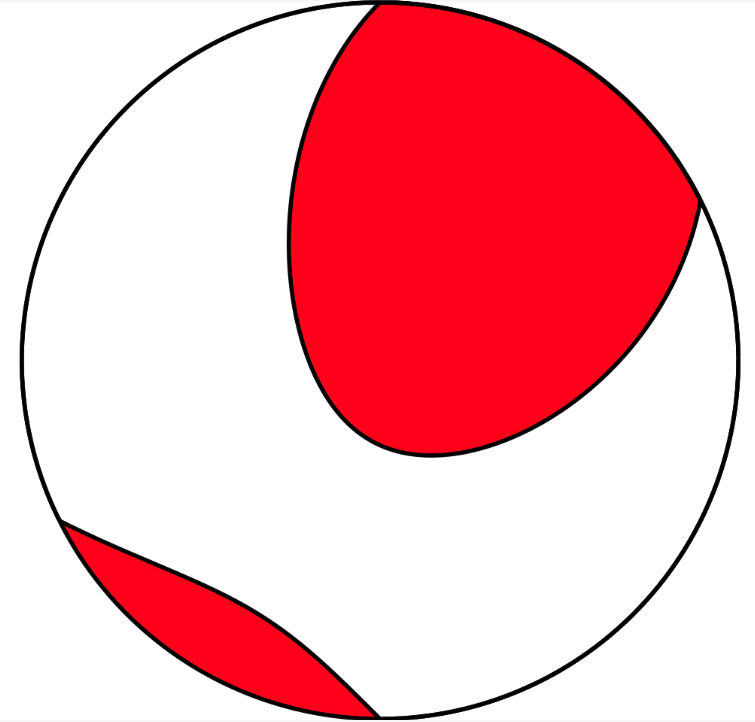

In [48]:
Image('Synthetic_input_source.png')

The directory **GFs** follows the pattern **GFs/id_event/depth/**.
For the given example, the Green Functions created in **SOLVER_REPO/20171201023244/15/PROCESSED/** have to be saved in  **MTUQ_TEST/GFs/20171201023244/15**. Run the following cell for creating the subdirectories in **20171201023244** and **15** in **GFs** and copy the Green Functions 

In [49]:
%mkdir -p GFs/20171201023244/15 
%cp ../SOLVER_REPO/20171201023244/15/PROCESSED/* GFs/20171201023244/15/

mkdir: GFs/20171201023244: File exists
mkdir: GFs/20171201023244/15: File exists


**4.1 Double couple grid-search:**

The script **SPECFEM3D_GFs_GridSearch.DoubleCouple_SW_options.py** performs a double couple moment tensor estimation. 
Run the following cell for seing the options:

In [50]:
%run -i 'SPECFEM3D_GFs_GridSearch.DoubleCouple_SW_options.py' -h 

usage: SPECFEM3D_GFs_GridSearch.DoubleCouple_SW_options.py [-h] [-event EVENT]
                                                           [-evla EVLA]
                                                           [-evlo EVLO]
                                                           [-evdp EVDP]
                                                           [-mw MW]
                                                           [-time TIME]
                                                           [-np NP] [-fb FB]

Input event info run MTUQ

optional arguments:
  -h, --help    show this help message and exit
  -event EVENT  event (event directory must be in main dir): -event 20140823183304000 
  -evla EVLA    Event latitude: -evla 64.68 
  -evlo EVLO    Event longitude: -evla -98.2 
  -evdp EVDP    Event depth in m: -evdp 10000.0 
  -mw MW        Event magnitude: -mw 4.7
  -time TIME    Earthquake origin time: -time 2014-08-25T16:19:03.00000Z
  -np NP        Number of points per axis: -np 10
 

The parameters shown in the next cell will launch the moment tensor estimation for the test event prepared for this example. 

20171201023244
Reading data...

Processing data...

Reading Greens functions...



/Users/felix/Documents/Software/specfem3d/mtuq/mtuq/greens_tensor/SPECFEM3D.py:26: UserWarning: SPECFEM3D modules have not yet been tested.
  warnings.warn("SPECFEM3D modules have not yet been tested.")


Processing Greens functions...

Evaluating surface wave misfit...

  Number of misfit evaluations: 1.000e+03

  Elapsed time (s): 14.987130

Generating figures...



/Users/felix/Documents/Software/specfem3d/mtuq/mtuq/util/__init__.py:264: UserWarning: plot_beachball: Falling back to ObsPy.
  warnings.warn(*args, **kwargs)
/Users/felix/Documents/Software/specfem3d/mtuq/mtuq/util/__init__.py:264: UserWarning: plot_beachball failed. No figure generated.
  warnings.warn(*args, **kwargs)


FileNotFoundError: [Errno 2] No such file or directory: 'tmp.png'

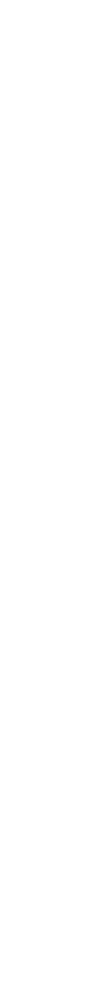

In [51]:
%run -i 'SPECFEM3D_GFs_GridSearch.DoubleCouple_SW_options.py' -event 20171201023244 -evla 30.734 -evlo 57.390 -evdp 15000 -mw 5.5 -time 2017-12-01T02:32:44.00000Z -np 10 -fb 10-100 

If you have an error like:

FileNotFoundError: [Errno 2] No such file or directory: 'tmp.png'

Then run the script directly in the terminal:

*mpirun -np 8 python SPECFEM3D_GFs_GridSearch.DoubleCouple_SW_options.py -event 20171201023244 -evla 30.734 -evlo 57.390 -evdp 15000 -mw 5.5 -time 2017-12-01T02:32:44.00000Z -np 10 -fb 10-100*

Open the file **20171201023244DC_waveforms.png** for seing the MTUQ output

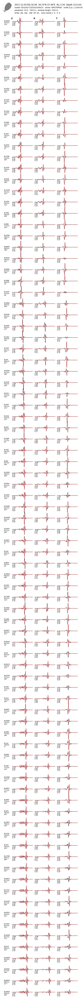

In [52]:
Image("20171201023244DC_waveforms.png")

The synthetics (red) are similar but not identical to the observed data (black). This is because the grid search is coarse and because the it is constrained for being double couple. However, the true source is deviatoric. As finer is the grid-search, which implies a larger number in the option **-np**, more similar the synthetics and observed seismograms will be. 

For seeing the uncertainties associated to the grid-search, open the figure **20171201023244DC_misfit.png**.

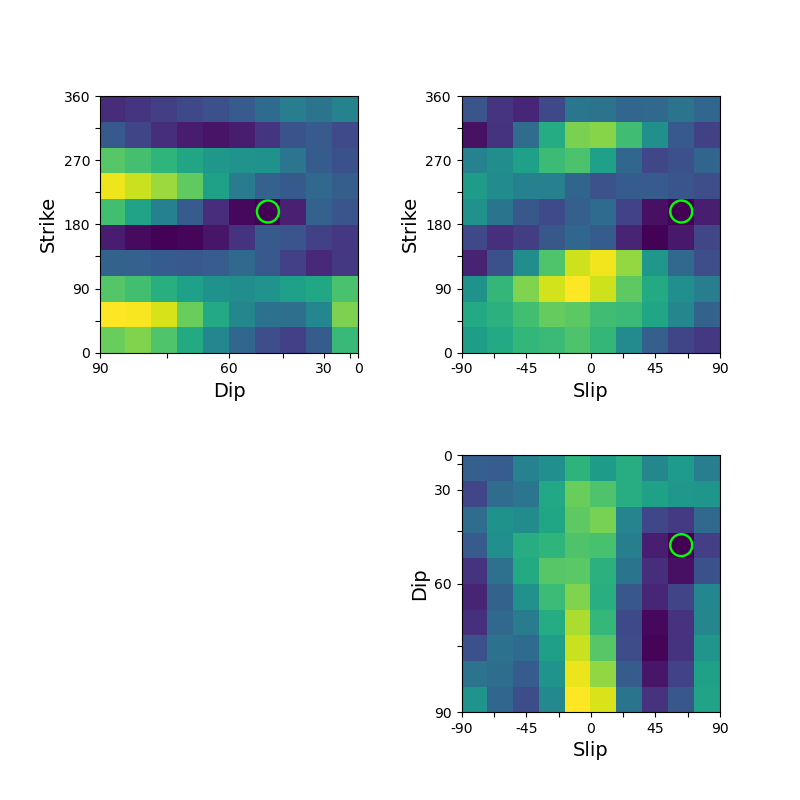

In [53]:
Image("20171201023244DC_misfit.png")

**4.1 Full moment tensor grid-search:**

The script **SPECFEM3D_GFs_GridSearch.FMT_SW_options.py** performs a full moment tensor estimation. 
Options are the same than the double couple script. Run the following cell for seeing the options:

In [54]:
%run -i 'SPECFEM3D_GFs_GridSearch.FMT_SW_options.py' -h 

usage: SPECFEM3D_GFs_GridSearch.FMT_SW_options.py [-h] [-event EVENT]
                                                  [-evla EVLA] [-evlo EVLO]
                                                  [-evdp EVDP] [-mw MW]
                                                  [-time TIME] [-np NP]
                                                  [-fb FB]

Input event info run MTUQ

optional arguments:
  -h, --help    show this help message and exit
  -event EVENT  event (event directory must be in main dir): -event 20140823183304000 
  -evla EVLA    Event latitude: -evla 64.68 
  -evlo EVLO    Event longitude: -evla -98.2 
  -evdp EVDP    Event depth in m: -evdp 10000.0 
  -mw MW        Event magnitude: -mw 4.7
  -time TIME    Earthquake origin time: -time 2014-08-25T16:19:03.00000Z
  -np NP        Number of points per axis: -np 10
  -fb FB        Frequency band for filtering data in seconds: -fb 10-100


The following cell will launch a full moment tensor grid-search 

20171201023244
Reading data...

Processing data...

Reading Greens functions...



/Users/felix/Documents/Software/specfem3d/mtuq/mtuq/greens_tensor/SPECFEM3D.py:26: UserWarning: SPECFEM3D modules have not yet been tested.
  warnings.warn("SPECFEM3D modules have not yet been tested.")


Processing Greens functions...

Evaluating surface wave misfit...

  Number of misfit evaluations: 6.875e+03

  Elapsed time (s): 35.475208

Generating figures...



/Users/felix/Documents/Software/specfem3d/mtuq/mtuq/util/__init__.py:264: UserWarning: plot_beachball: Falling back to ObsPy.
  warnings.warn(*args, **kwargs)
/Users/felix/Documents/Software/specfem3d/mtuq/mtuq/util/__init__.py:264: UserWarning: plot_beachball failed. No figure generated.
  warnings.warn(*args, **kwargs)


FileNotFoundError: [Errno 2] No such file or directory: 'tmp.png'

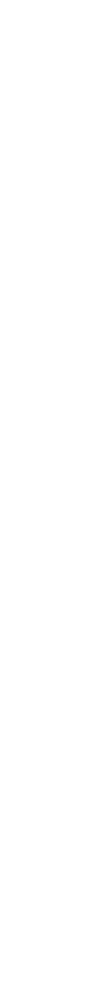

In [55]:
%run -i 'SPECFEM3D_GFs_GridSearch.FMT_SW_options.py' -event 20171201023244 -evla 30.734 -evlo 57.390 -evdp 15000 -mw 5.5 -time 2017-12-01T02:32:44.00000Z -np 5 -fb 10-100

If you have an error like:

FileNotFoundError: [Errno 2] No such file or directory: 'tmp.png'

Then run the script directly in the terminal:

*mpirun -np 8 python SPECFEM3D_GFs_GridSearch.FMT_SW_options.py -event 20171201023244 -evla 30.734 -evlo 57.390 -evdp 15000 -mw 5.5 -time 2017-12-01T02:32:44.00000Z -np 9 -fb 10-100*

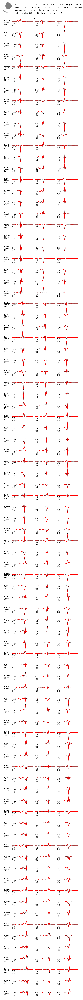

In [56]:
Image("20171201023244FMT_cat_waveforms.png")

For seeing the uncertainties associated to the grid-search, open the figure **20171201023244FMT_cat_misfit_mt.png**.

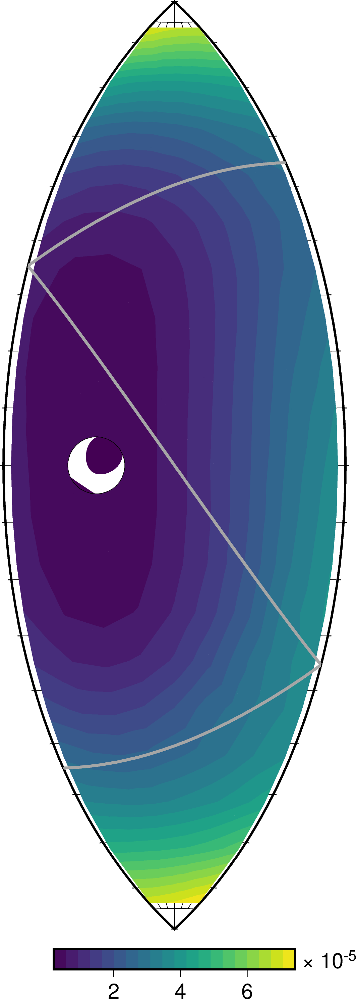

In [57]:
Image("20171201023244FMT_cat_misfit_mt.png")

Observe that the synthetics and observed are almost identical and the retrieved source is almost the same than the input source. Eventually with a large enough number point per axis (**-np**), the retrieved source will be identical to the input one, and synthetics and "observed" data will be identical as well. 